In [4]:
import os
import re
from os.path import join

import sympy
from sympy import Symbol, sqrt, cos, pi, symbols
import numpy as np
import matplotlib.pylab as plt
import pandas as pd
from collections import OrderedDict

import qnet
from qnet.algebra import *

import QDYN

from src.notebook_plots_v1 import plot_bs_decay, display_hamiltonian, display_eq, show_summary_dicke
from src.single_sided_network_v1 import network_slh
from src.dicke_single_model_v1 import write_dicke_single_model, err_dicke_single
from src.doit_actions_v1 import run_traj_prop

from doit.tools import register_doit_as_IPython_magic

In [5]:
qnet.init_printing()

In [6]:
DOIT_CONFIG = {
    'backend': 'json',
    'dep_file': '.doit_db/2017-06-01_mg_dicke1_QSL_traj1-analysis.json',
}
register_doit_as_IPython_magic()

$
\newcommand{ket}[1]{\vert #1 \rangle}
\newcommand{bra}[1]{\langle #1 \vert}
\newcommand{Op}[1]{\hat{#1}}
$

# Analysis: QSL for Single-Excitation Dicke state

*This notebook used a buggy version of QDYN where the MCWF trajectory optimization would use a simple non-Hermtian propagation for the forward propagation*

Data is now located in `./data/dicke1_QSL_1traj_xxx/`

## collect runfolders

In [7]:
DATA_ROOT = './data/dicke1_QSL_1traj_xxx'

In [8]:
RX_LEAFFOLDER = re.compile(r'rf_(?P<nodes>\d+)nodes_T(?P<T>[\d_]+)')

In [9]:
def collect_runfolders(data_root):
    runfolders = []
    for dirpath, dirnames, filenames in os.walk(data_root):
        if not dirnames:
            if RX_LEAFFOLDER.match(os.path.split(dirpath)[-1]):
                runfolders.append(dirpath)
            else:
                print(
                    "%s does not match %s" % (dirpath, rx_leaffolder.pattern))
    return runfolders

In [10]:
RUNFOLDERS = collect_runfolders(DATA_ROOT)

In [11]:
N_TRAJS = 1 # for evaluation purposes

## Propagation (doit task)

In [12]:
def traj1_has_no_jumps(rf):
    try:
        with open(join(rf, 'jump_record.dat.1')) as in_fh:
            return (len(in_fh.readlines()) == 1) # 1-line header only
    except FileNotFoundError:
        return None

In [13]:
def task_propagate():
    """Run propagation for every runfolder from params_df
    
    This will try to get the "best" case of no jumps.
    """
    jobs = {}
    for rf in RUNFOLDERS:
        yield {
            'name': str(rf),
            'actions': [
                (run_traj_prop, [rf, ], dict(n_trajs=N_TRAJS))],
            'uptodate': [(traj1_has_no_jumps, [rf, ])],
            'file_dep': [join(rf, 'pulse1.oct.dat'),],
            'targets': [join(rf, 'state_final.dat.1'),]}

In [17]:
%doit run -n 40 propagate

-- propagate:./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_4nodes_T20
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_5nodes_T5
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_2nodes_T2_25
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_4nodes_T2
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_40
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_4nodes_T50
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_5nodes_T3
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_5nodes_T0_50
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_4nodes_T3
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1_40
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_4nodes_T5
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_6nodes_T6
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_6nodes_T18
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_30
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_4nodes_T4
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_6nodes_T15
-- propagate:./data/dicke1_QSL_1traj_xxx/rf_6nodes_T0_50
-- pro

.  propagate:./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_80
.  propagate:./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_10


## Error Collection

In [14]:
def collect_table(runfolders):
    n_nodes = []
    T = []
    iters = []
    err = []
    for rf in runfolders:
        m = RX_LEAFFOLDER.match(os.path.split(rf)[-1])
        n_nodes.append(int(m.group('nodes')))
        T.append(float(m.group('T').replace('_', '.')))
        pulse = QDYN.pulse.Pulse.read(join(rf, 'pulse1.oct.dat'))
        iters.append(pulse.oct_iter)
        err.append(err_dicke_single(
            rf, final_states_glob='state_final.dat*', rho=False))
    return pd.DataFrame(
        OrderedDict([
            ('n_nodes', n_nodes), ('T', T), ('iters', iters), ('err', err),
            ('rf', runfolders)])
    ).sort_values(['n_nodes', 'T']).reset_index(drop=True)

In [15]:
TABLE = collect_table(RUNFOLDERS)

In [16]:
print(TABLE.to_string())

     n_nodes      T  iters           err                                           rf
0          2   0.50  15000  9.095337e-02  ./data/dicke1_QSL_1traj_xxx/rf_2nodes_T0_50
1          2   1.00  30000  6.392398e-03     ./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1
2          2   1.10  30000  1.000000e+00  ./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_10
3          2   1.20  30000  2.401964e-03  ./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_20
4          2   1.25  30000  1.861410e-03  ./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_25
5          2   1.30  30000  1.449049e-03  ./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_30
6          2   1.40  30000  8.692790e-04  ./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_40
7          2   1.50  30000  5.137929e-04  ./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_50
8          2   1.60  30000  2.934902e-04  ./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_60
9          2   1.75  30000  1.175129e-04  ./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_75
10         2   1.80  30000  8.562940e-05  ./data/dicke

In [17]:
with open("./QSL_traj1-analysis.csv", 'w') as out_fh:
    out_fh.write("# output table from 2017-06-01_mg_dicke1_QSL_traj1-analysis.ipynb\n")
    TABLE.to_csv(out_fh, index=False)

In [21]:
!pwd

/data/goerz/quantum_transmission2


In [18]:
def ensure_monotonicity(table):
    """Drop rows in which error does not monotonically decrease"""
    while True:
        monotonic = table['err'].diff().fillna(-1) < 0
        if monotonic.all():
            break
        table = table[monotonic]
    return table

In [19]:
def plot_error(
        table, show=True, floor=1e-5, grid=False, monotonic=True,
        n_nodes_values=None, exclude=None):
    """Summary plot"""
    from mgplottools.mpl import set_axis
    fig = plt.figure(figsize=(10,6))
    ax = fig.add_subplot(111)
    if n_nodes_values is None:
        n_nodes_values = list(table['n_nodes'].unique())
    if exclude is not None:
        for n_nodes in exclude:
            try:
                n_nodes_values.remove(n_nodes)
            except ValueError:
                pass # don't care of n_nodes is not in list
    for n_nodes in n_nodes_values:
        sub_table = table[table['n_nodes'] == n_nodes]
        if monotonic:
            sub_table = ensure_monotonicity(sub_table)
        ax.plot(sub_table['T'], sub_table['err'].clip(floor, 1),
                'o-', label=str(n_nodes))
    ax.set_xlabel("time (dimensionless units)")
    ax.set_ylabel("error")
    ax.set_yscale('log')
    set_axis(ax, 'x', 0, 8, 0.5, minor=5)
    if grid:
        ax.grid()#which='both')
    ax.legend()
    if show:
        plt.show(fig)
    else:
        return fig

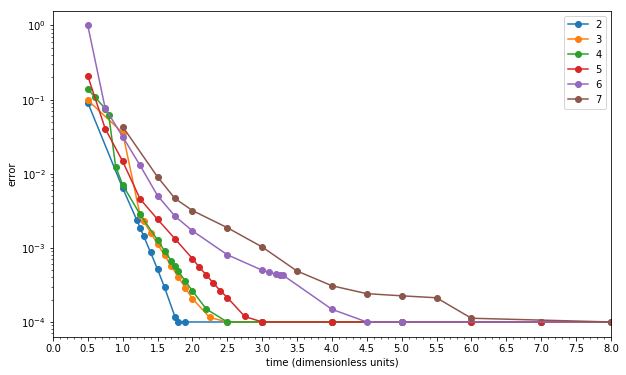

In [20]:
plot_error(TABLE, grid=False, floor=1e-4, monotonic=True, exclude=[8, ])

## pulses and dynamics

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T0_50


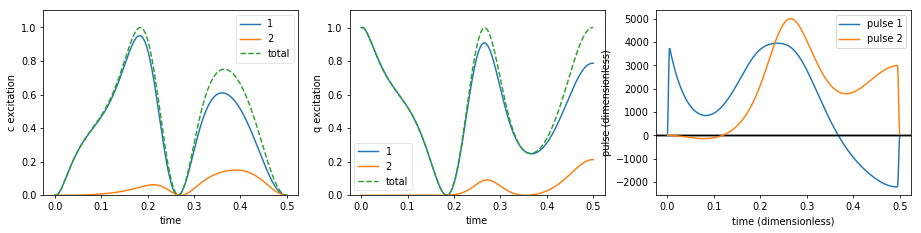

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1


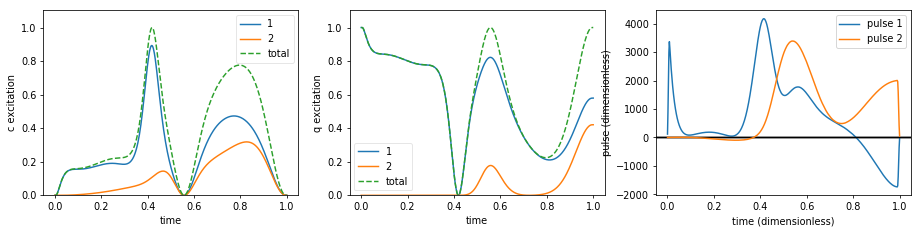

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_10


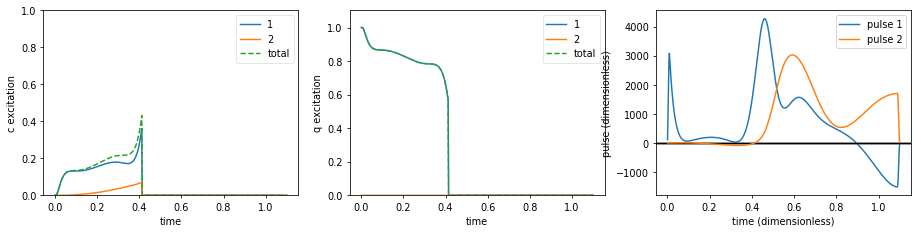

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_20


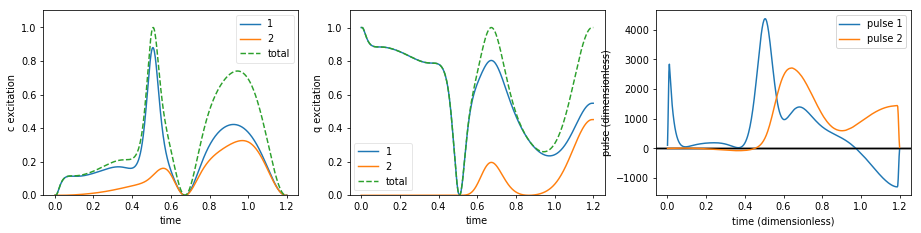

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_25


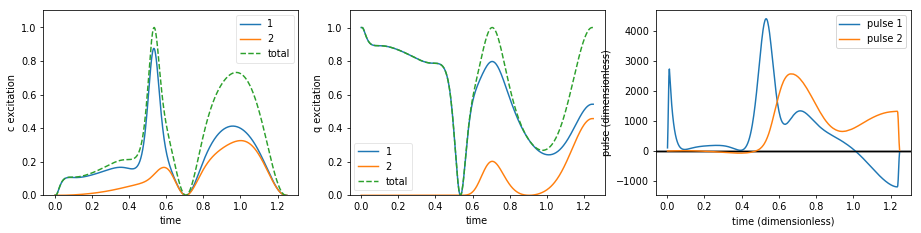

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_30


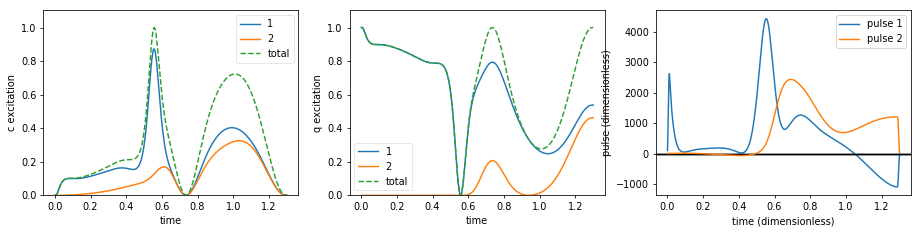

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_40


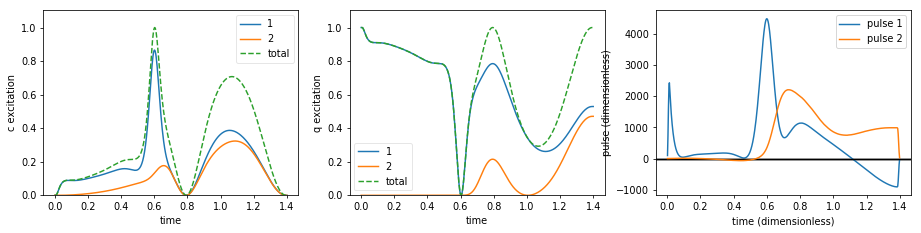

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_50


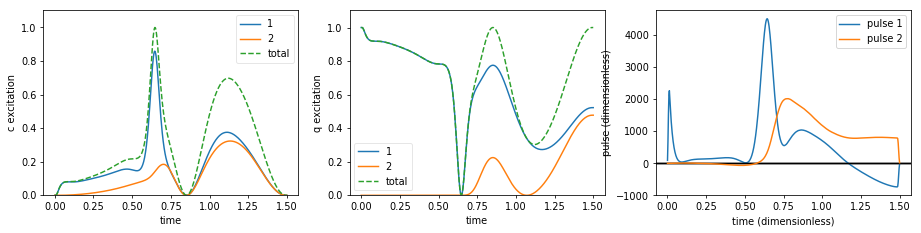

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_60


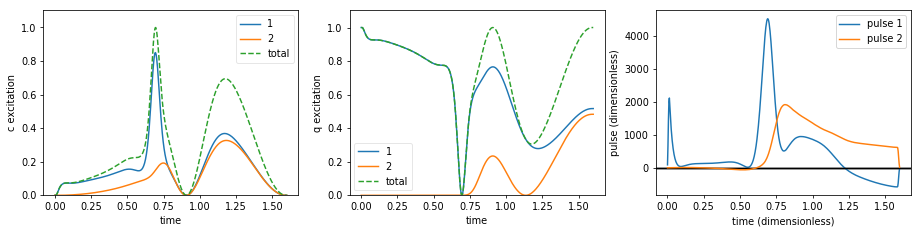

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_75


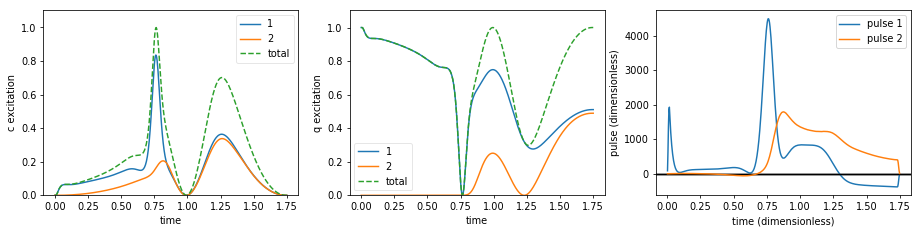

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_80


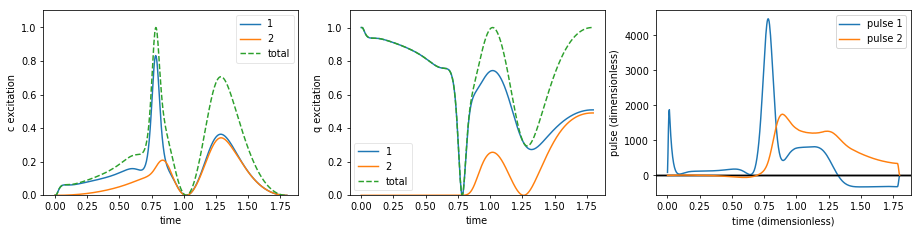

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T1_90


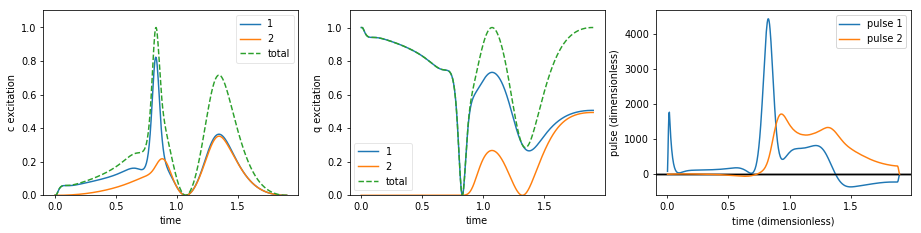

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T2


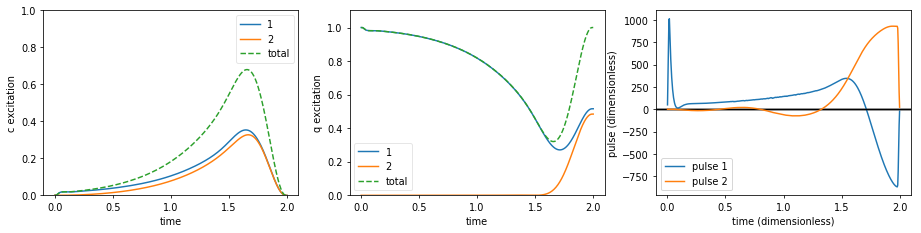

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T2_10


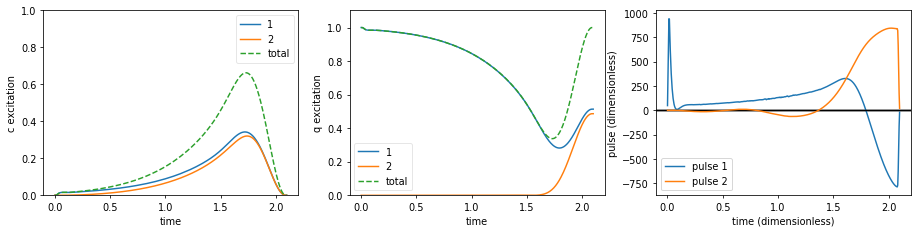

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T2_20


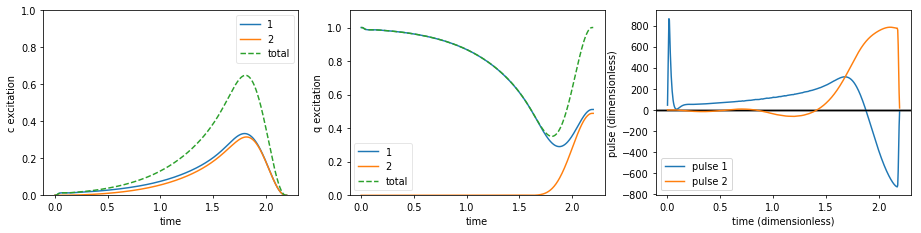

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T2_25


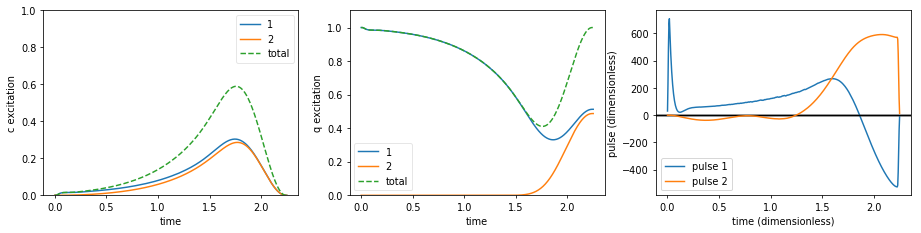

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T2_30


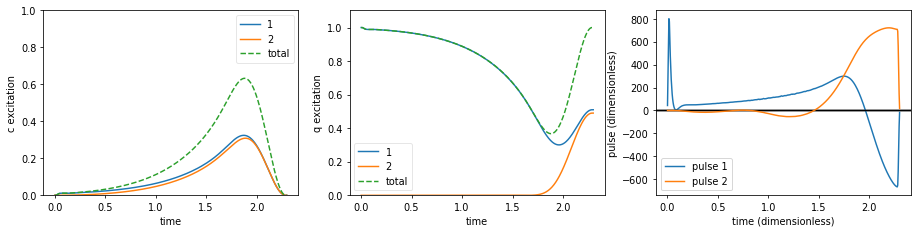

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T2_50


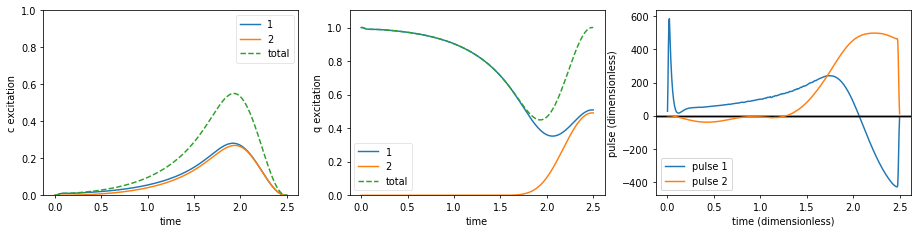

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T3


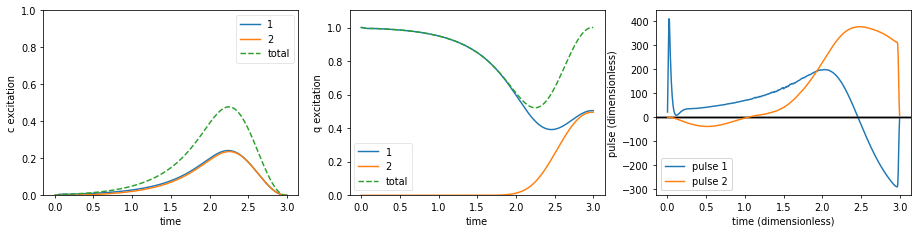

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T4


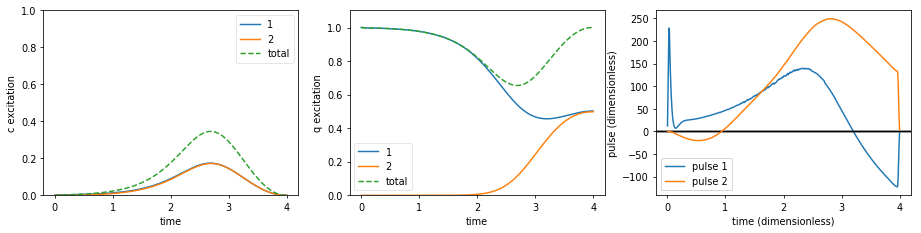

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T5


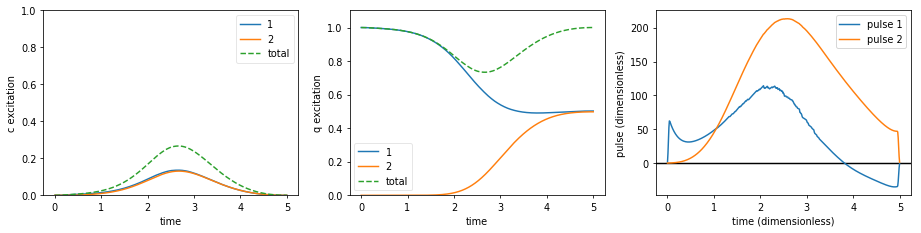

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T7


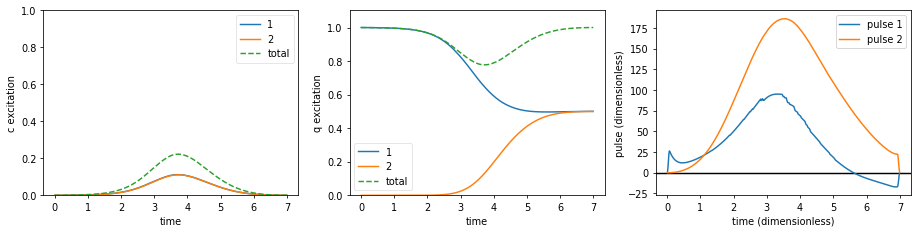

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T10


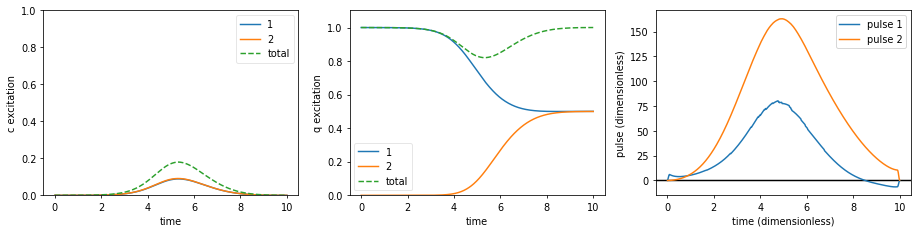

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T20


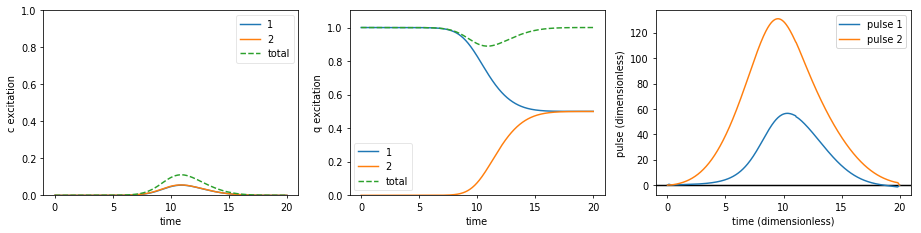

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T50


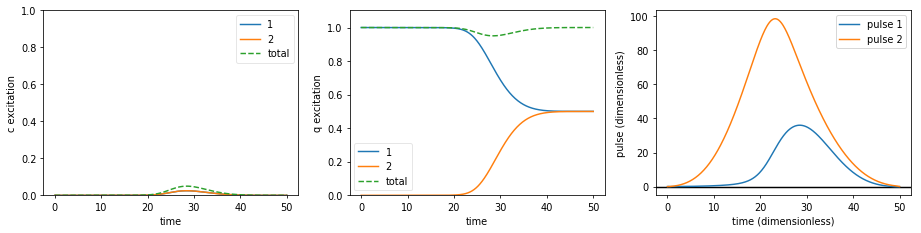

./data/dicke1_QSL_1traj_xxx/rf_2nodes_T70


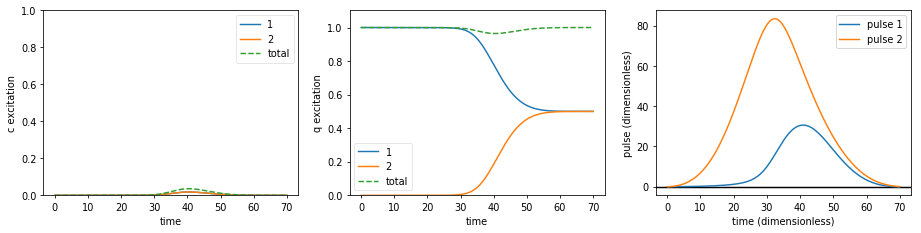

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T0_50


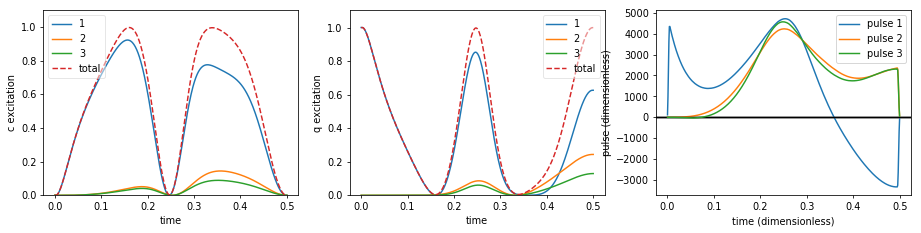

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1


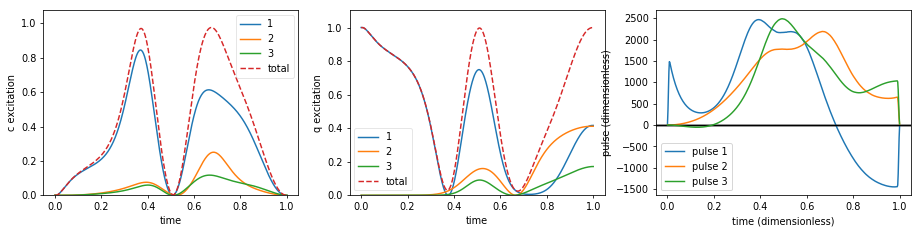

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1_25


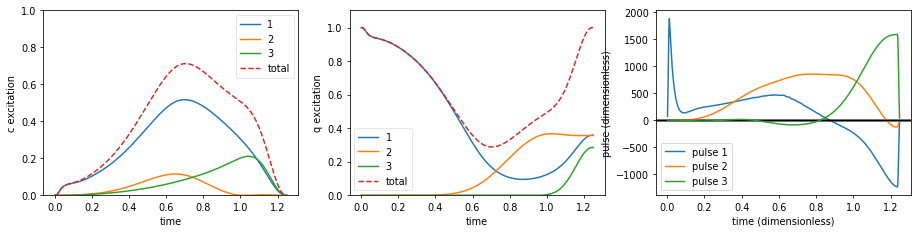

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1_30


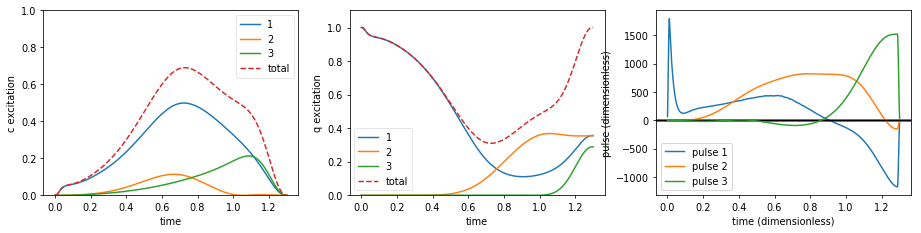

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1_40


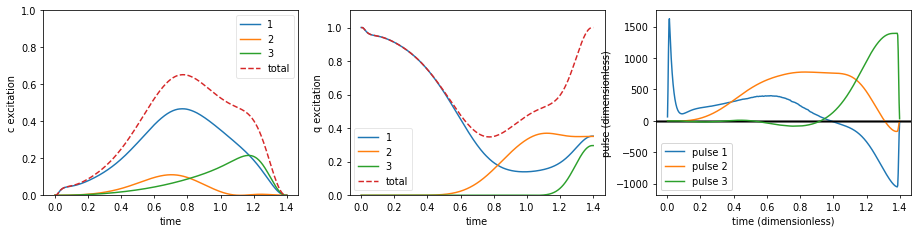

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1_50


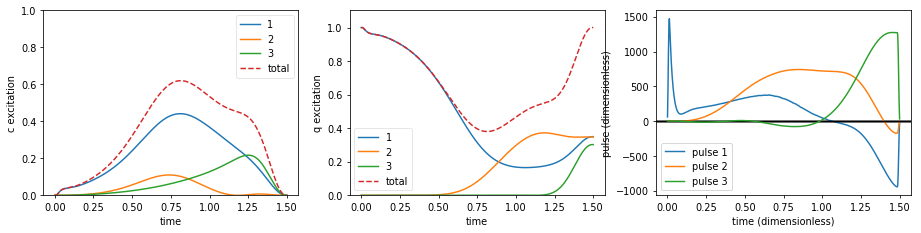

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1_60


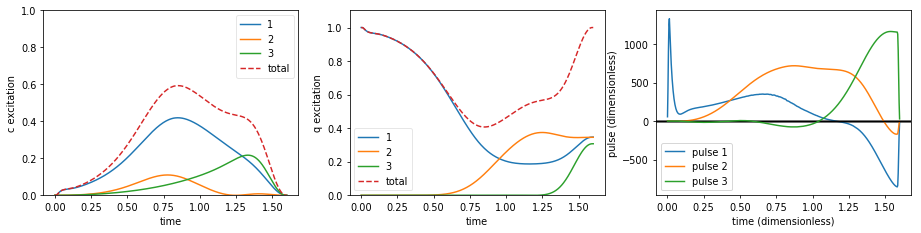

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1_70


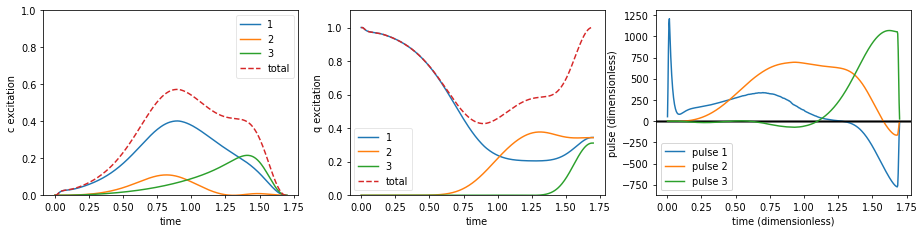

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1_75


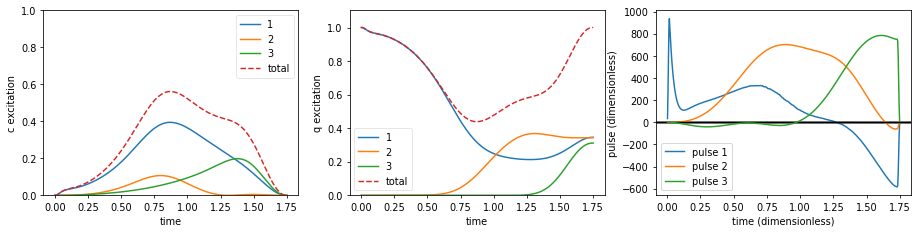

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1_80


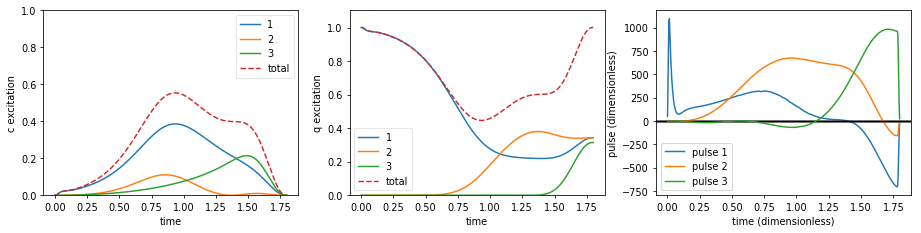

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T1_90


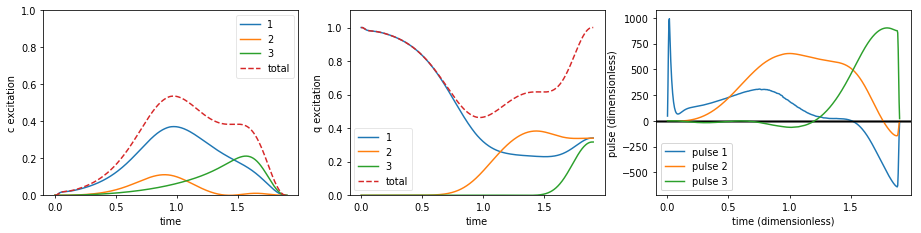

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T2


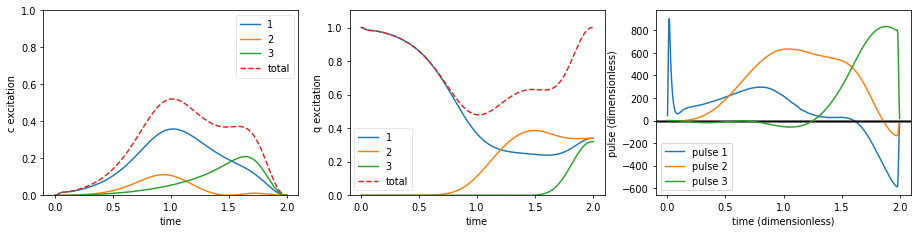

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T2_25


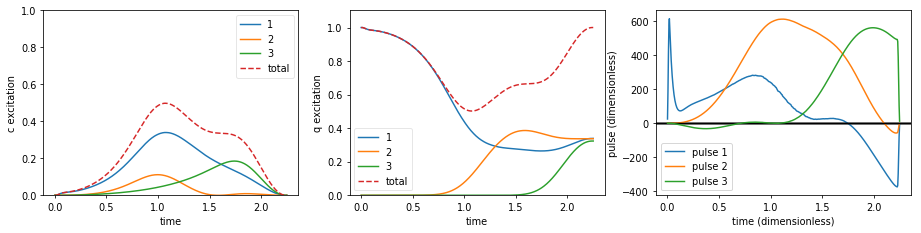

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T2_50


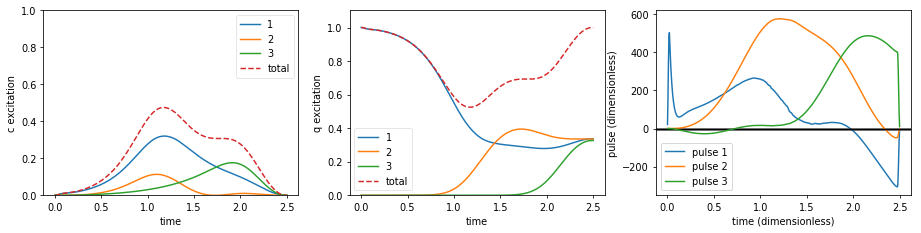

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T3


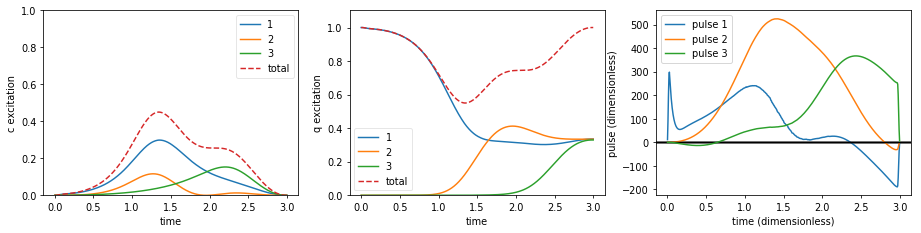

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T4


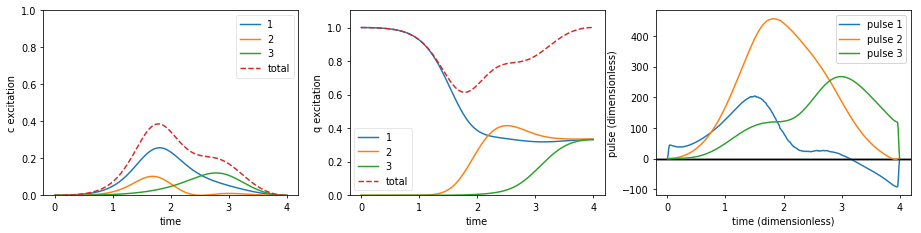

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T5


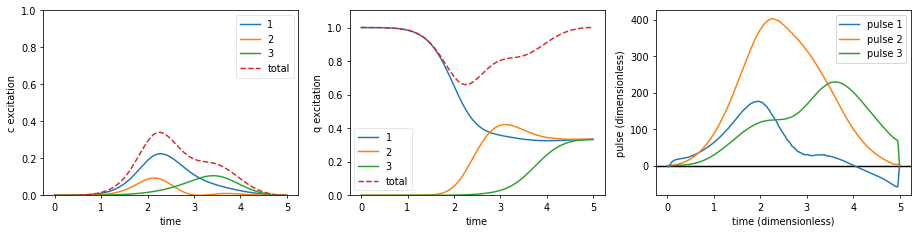

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T8


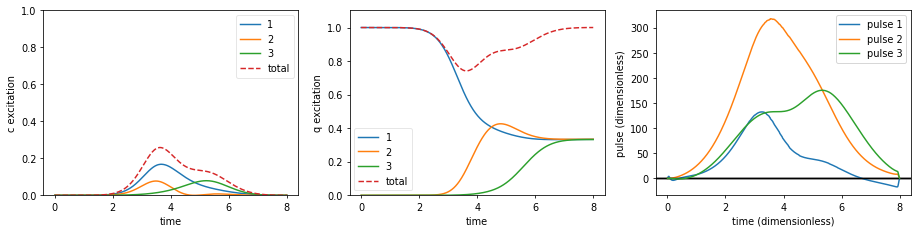

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T9


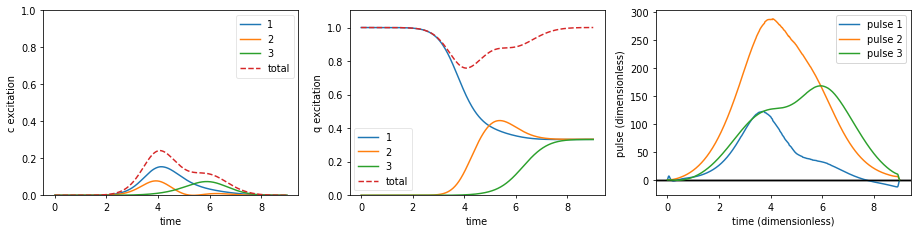

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T10


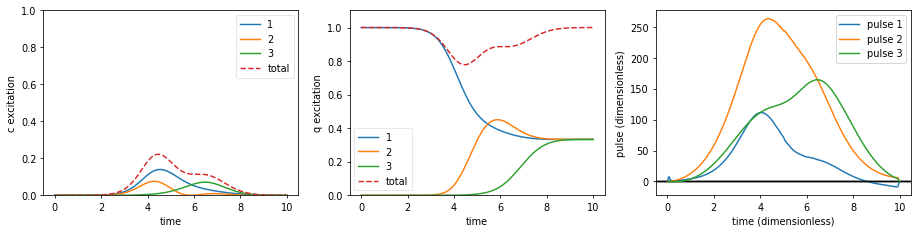

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T15


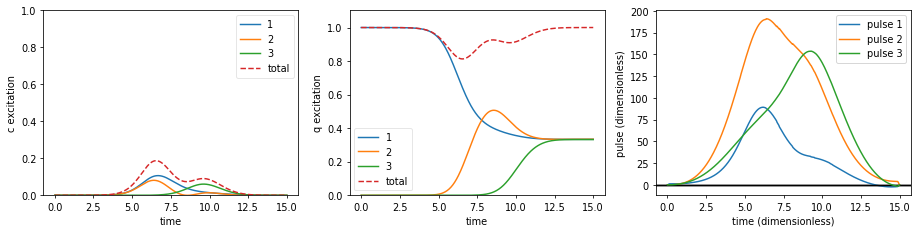

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T20


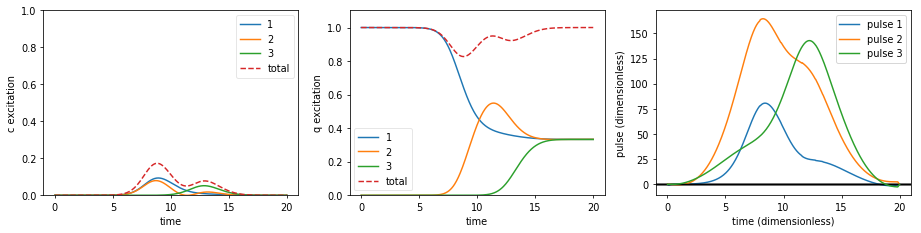

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T50


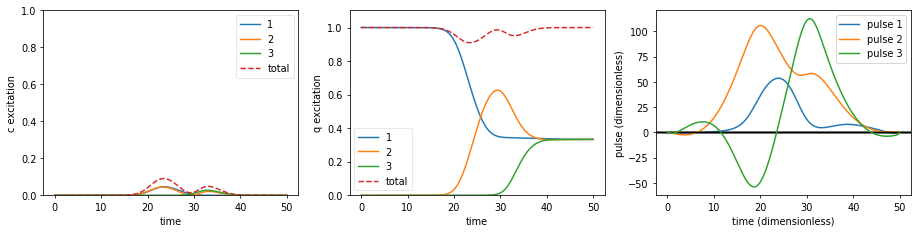

./data/dicke1_QSL_1traj_xxx/rf_3nodes_T70


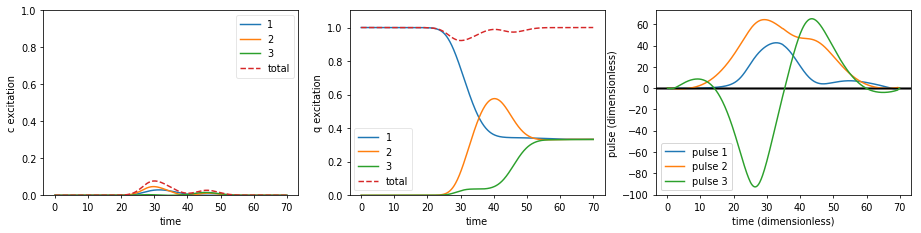

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T0_50


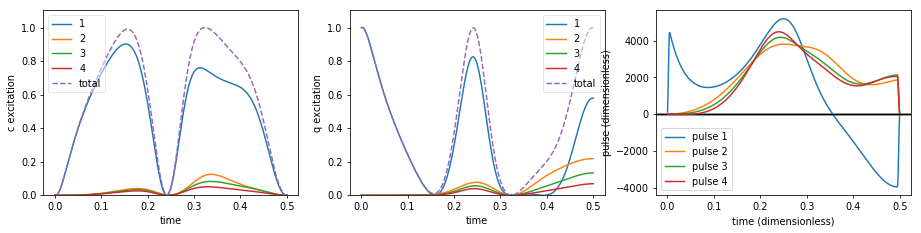

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T0_60


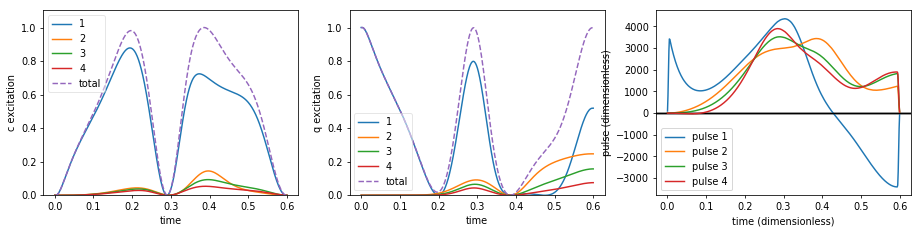

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T0_75


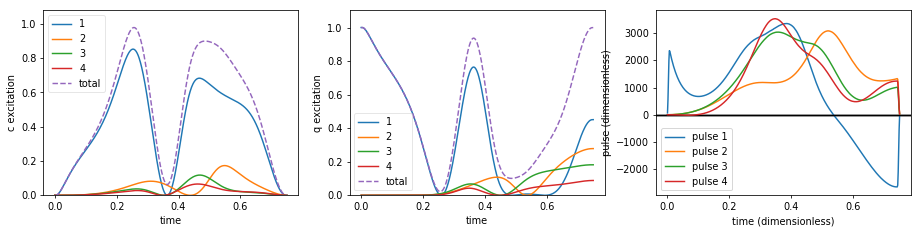

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T0_80


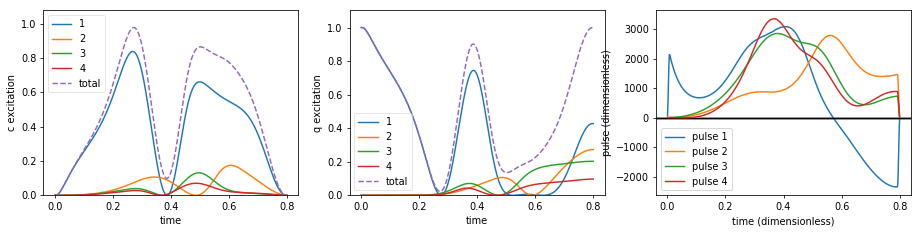

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T0_90


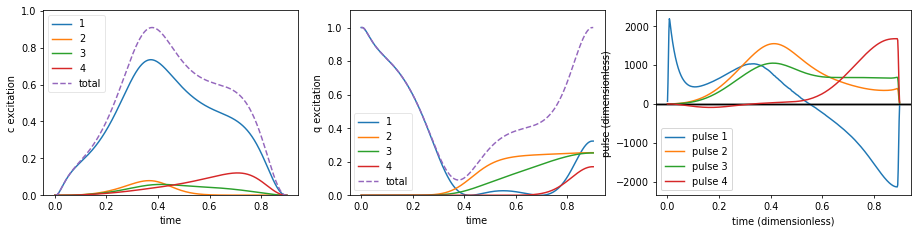

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T1


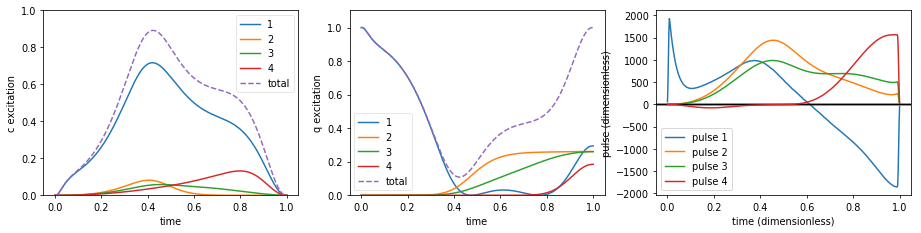

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T1_25


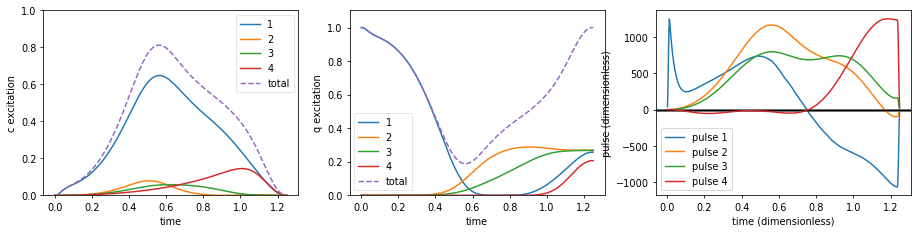

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T1_50


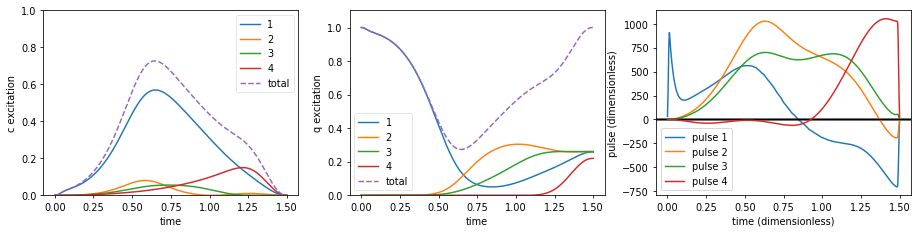

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T1_60


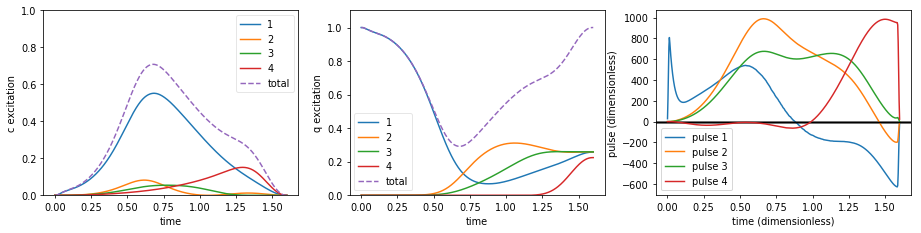

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T1_70


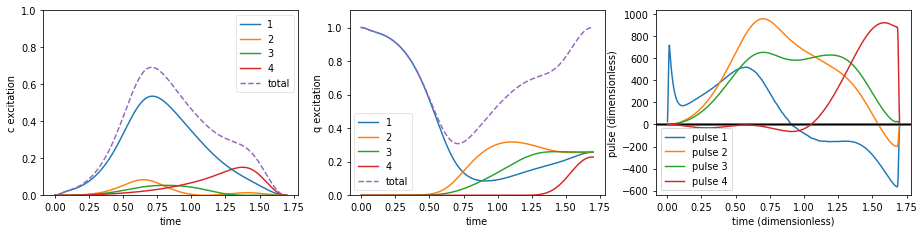

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T1_75


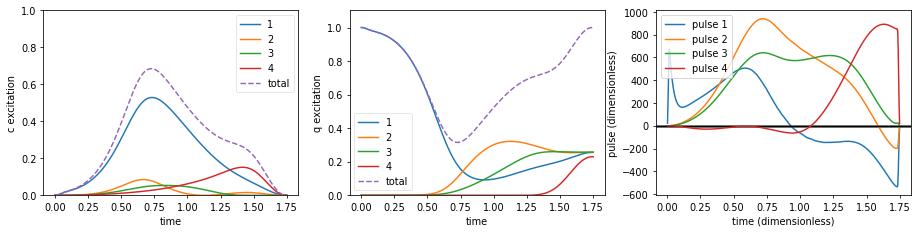

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T1_80


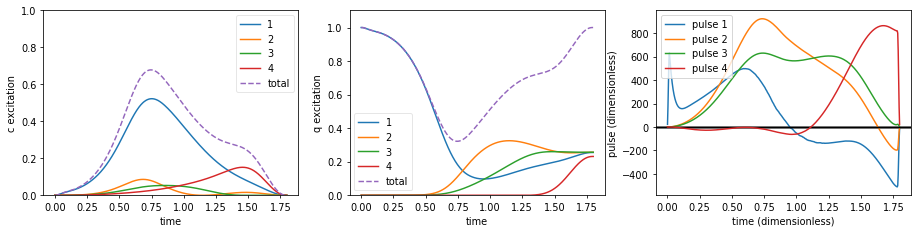

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T1_90


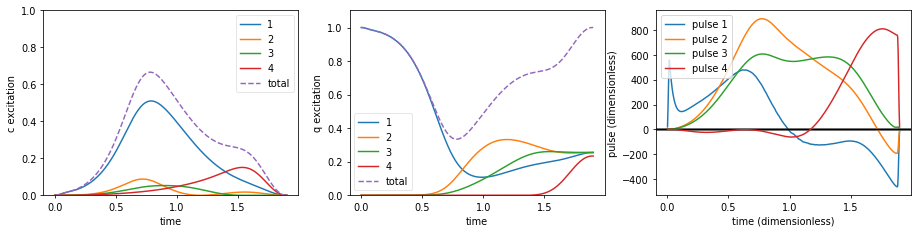

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T2


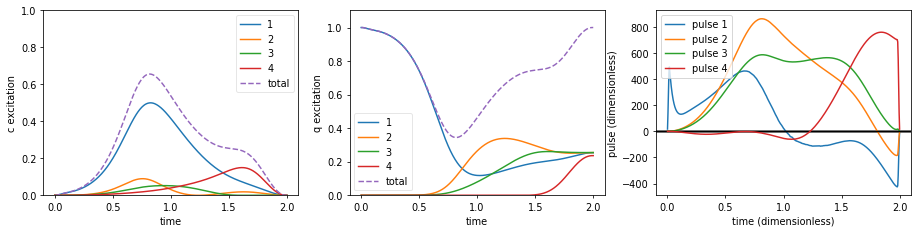

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T2_20


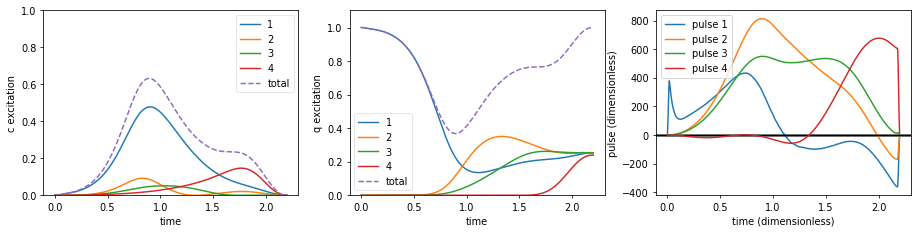

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T2_50


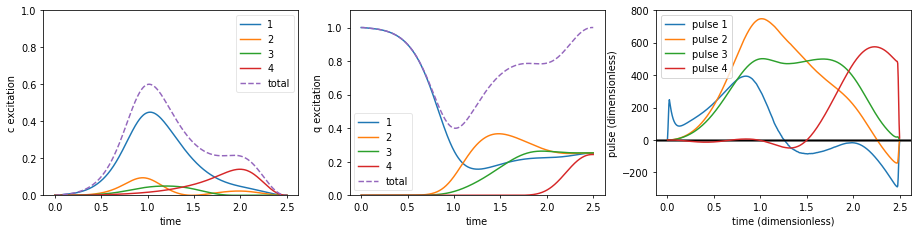

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T3


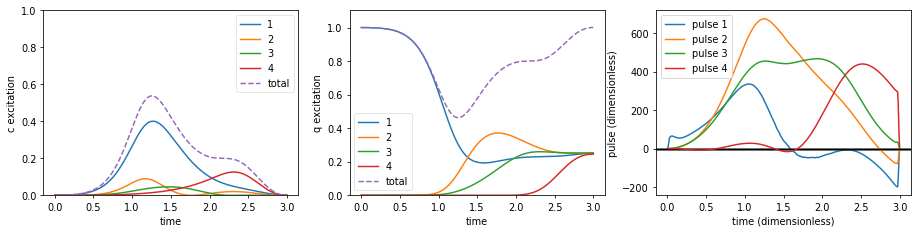

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T4


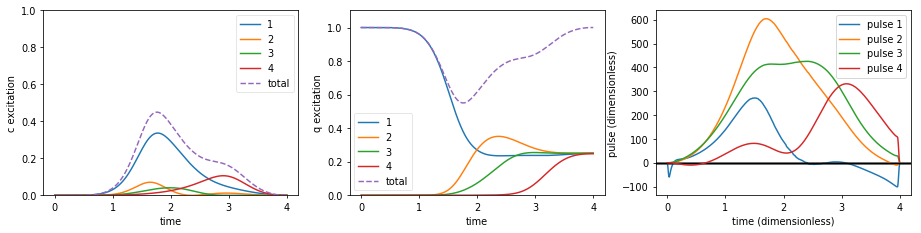

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T5


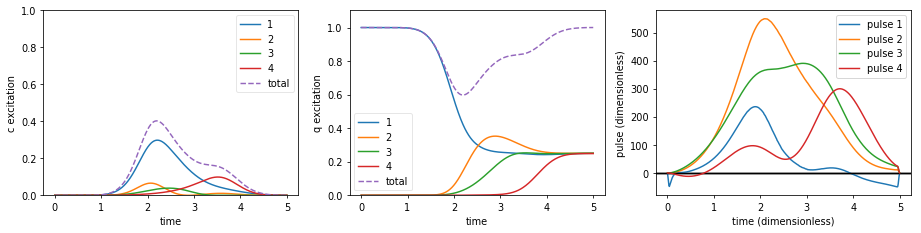

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T6


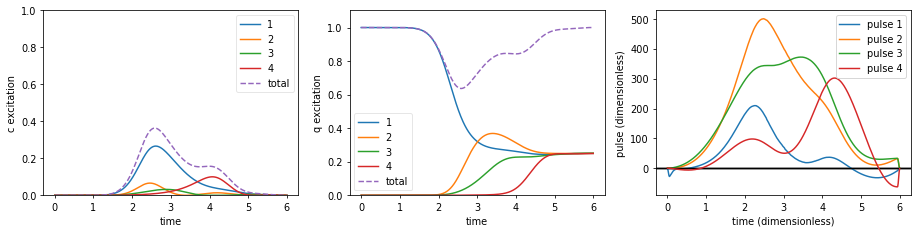

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T7


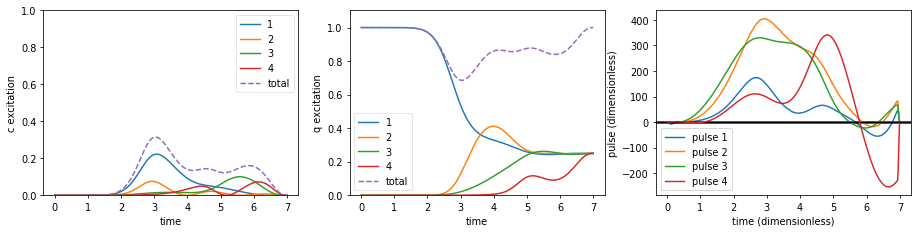

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T8


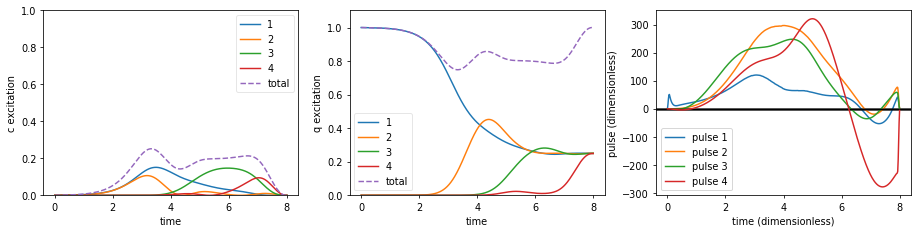

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T9


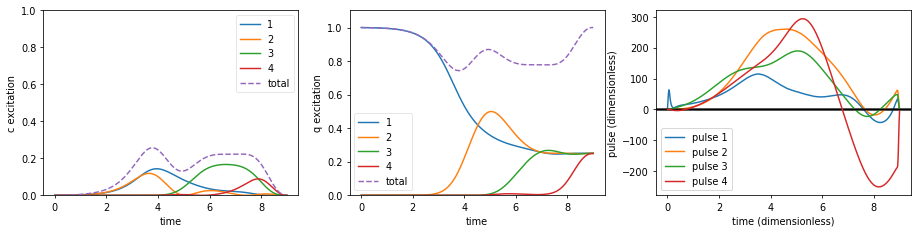

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T10


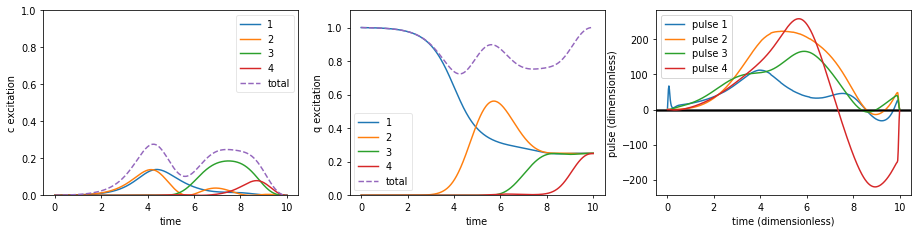

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T15


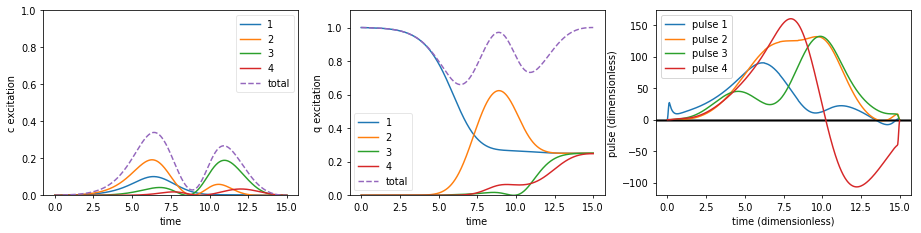

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T20


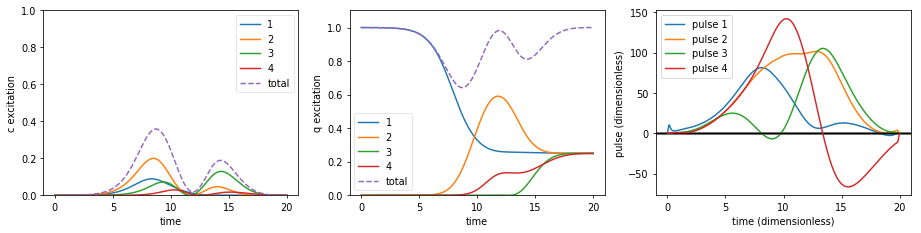

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T50


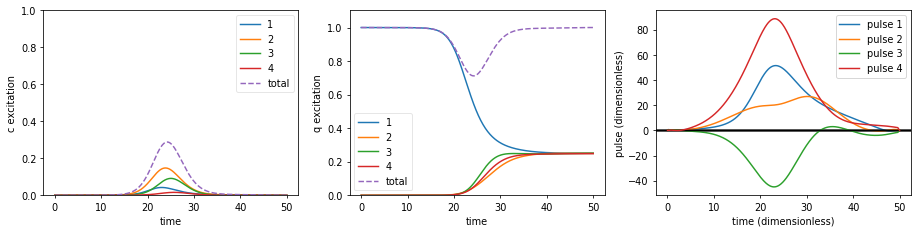

./data/dicke1_QSL_1traj_xxx/rf_4nodes_T70


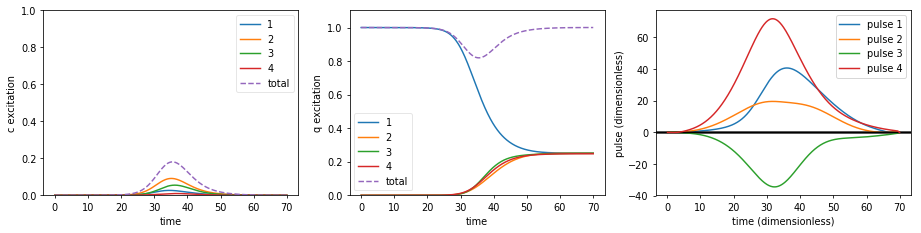

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T0_50


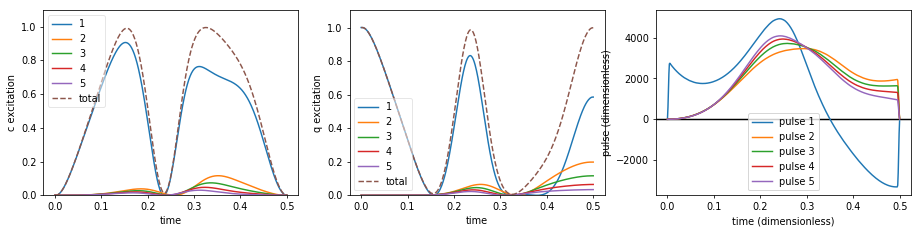

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T0_75


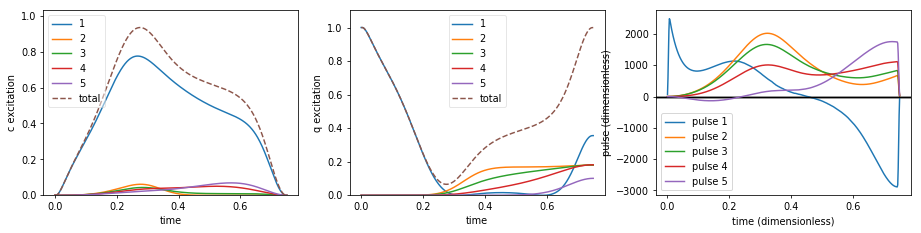

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T1


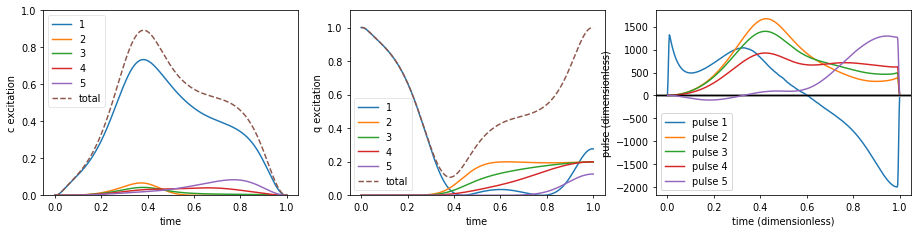

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T1_25


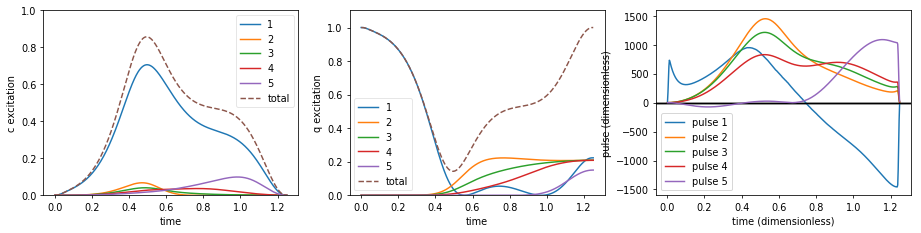

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T1_50


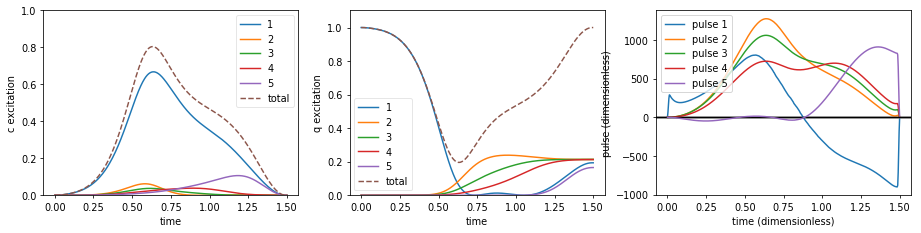

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T1_75


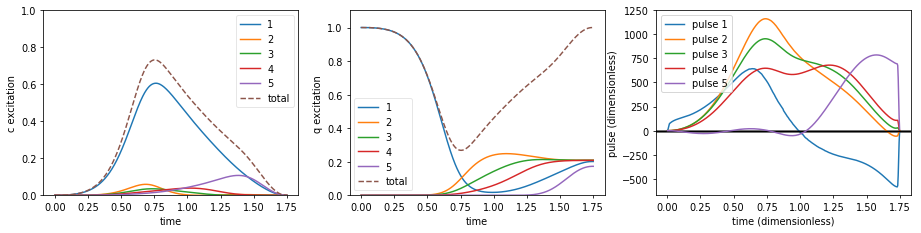

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T2


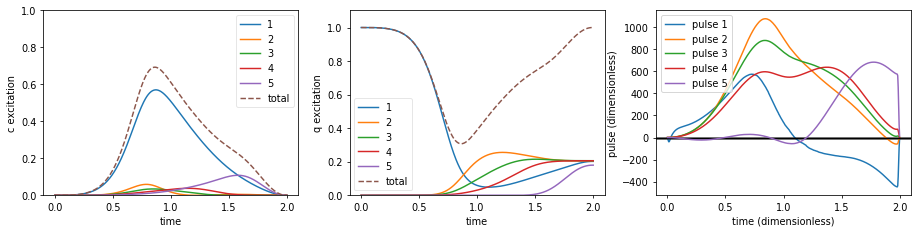

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T2_10


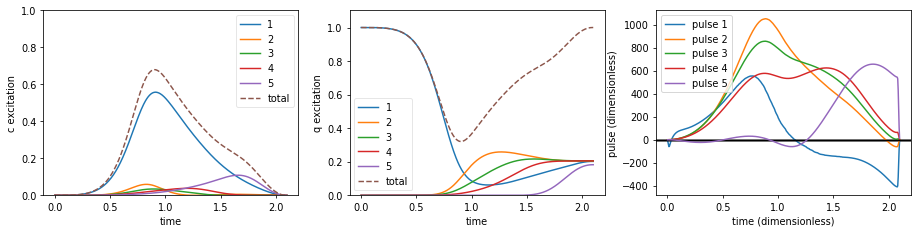

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T2_20


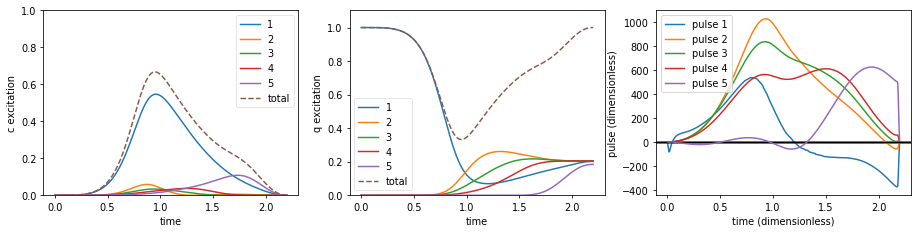

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T2_30


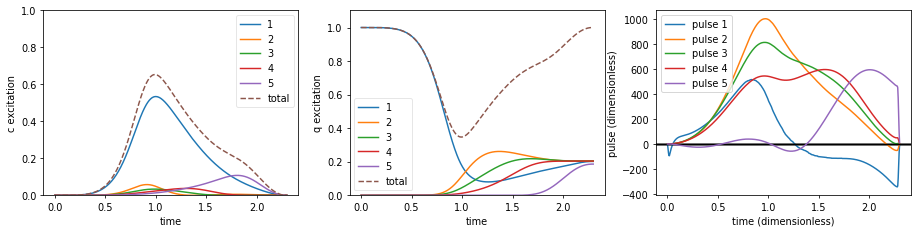

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T2_40


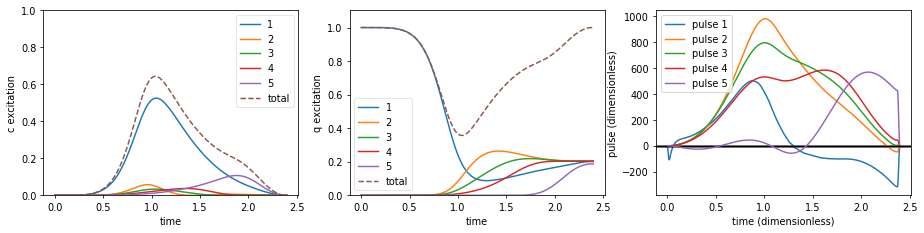

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T2_50


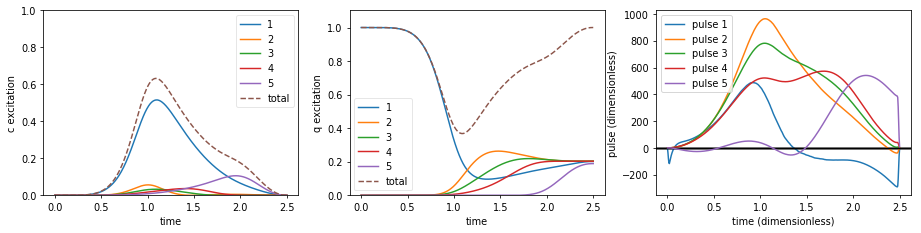

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T2_75


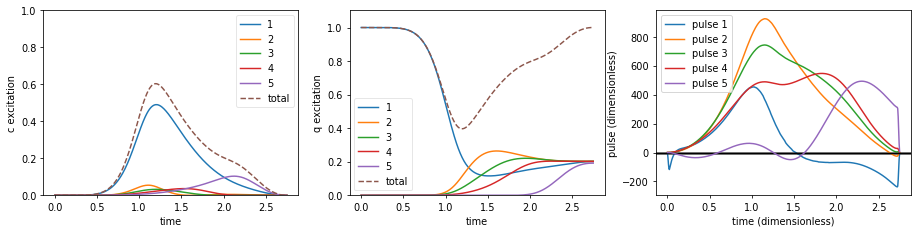

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T3


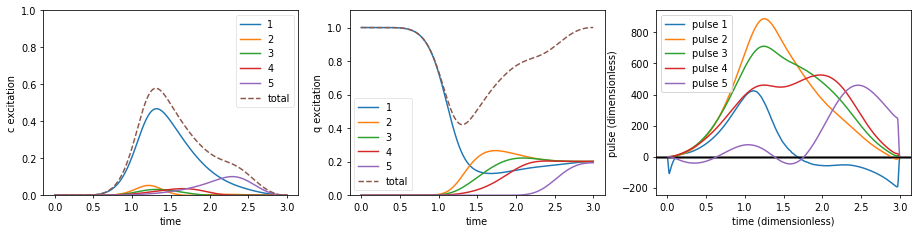

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T4


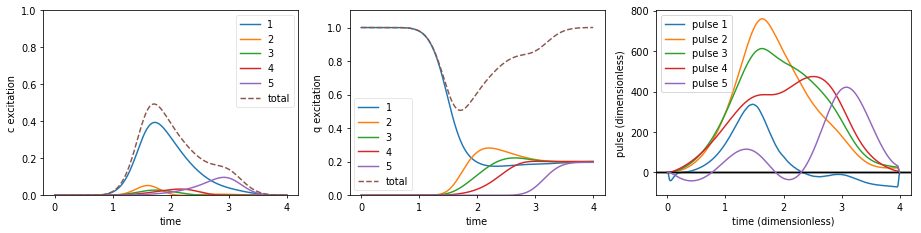

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T5


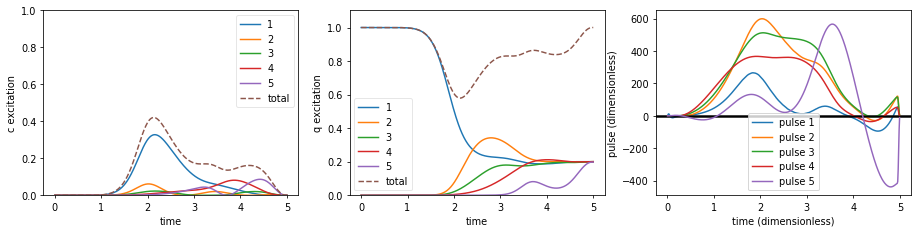

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T6


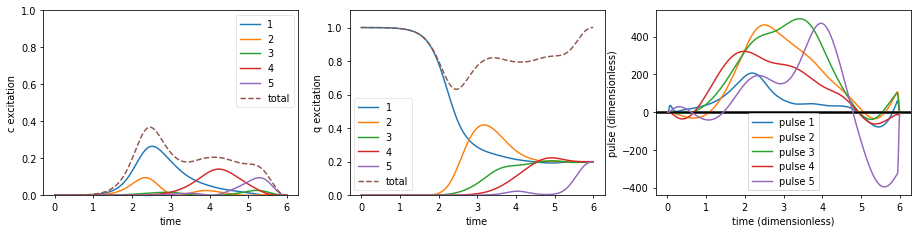

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T7


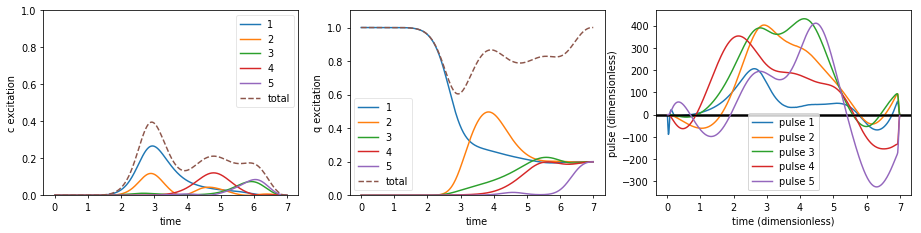

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T8


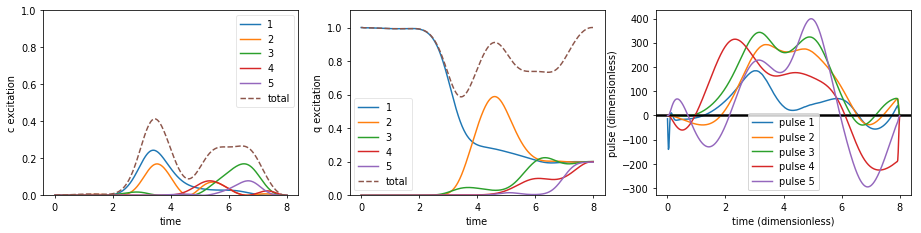

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T9


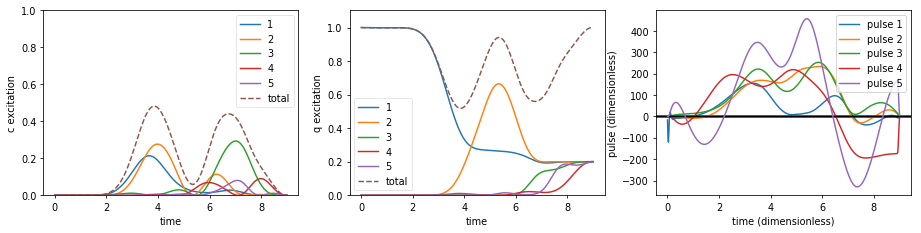

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T10


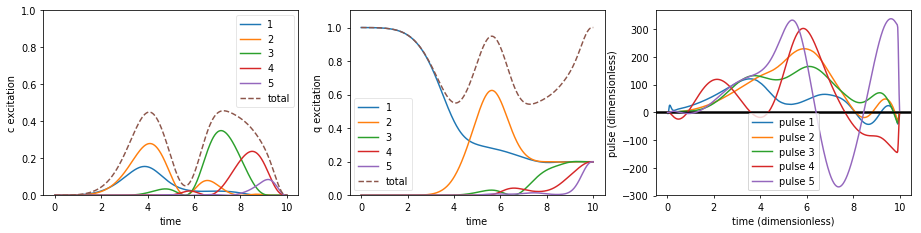

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T12


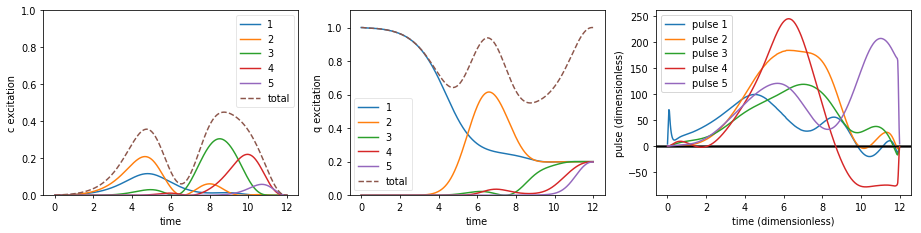

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T15


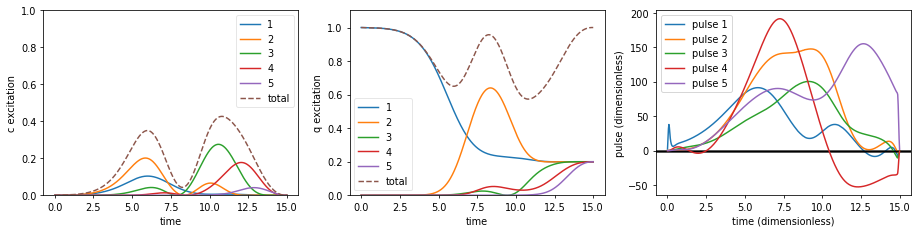

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T18


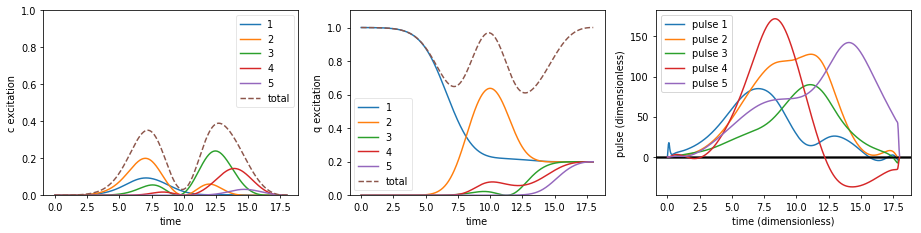

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T20


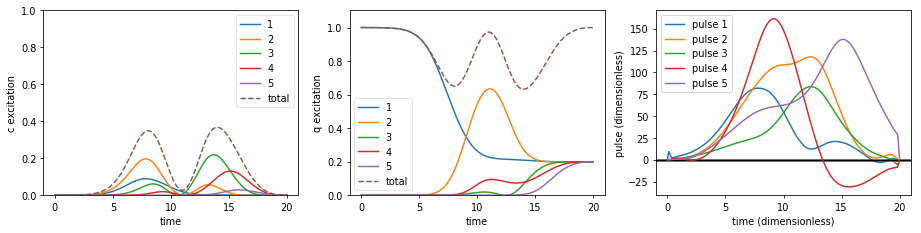

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T50


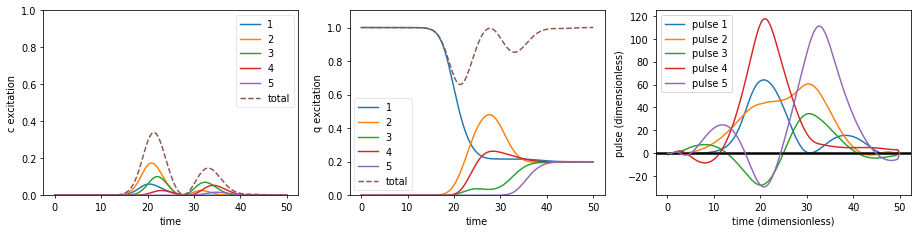

./data/dicke1_QSL_1traj_xxx/rf_5nodes_T70


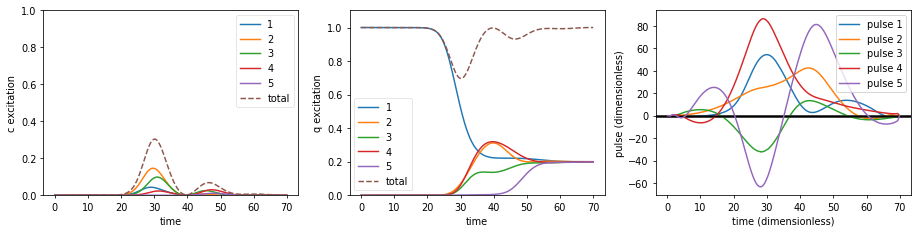

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T0_50


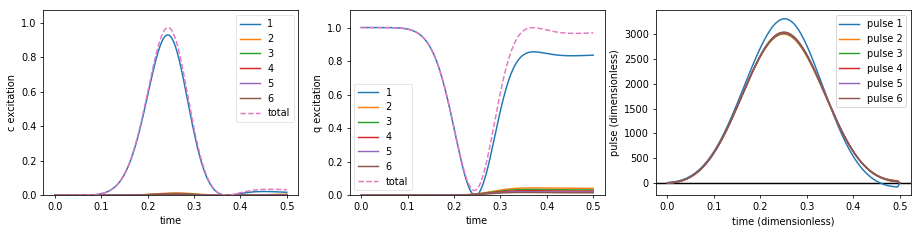

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T0_75


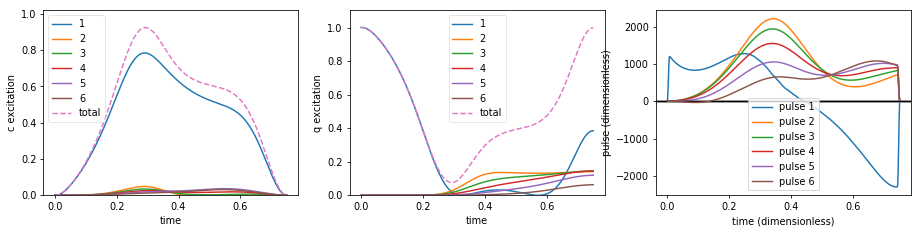

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T1


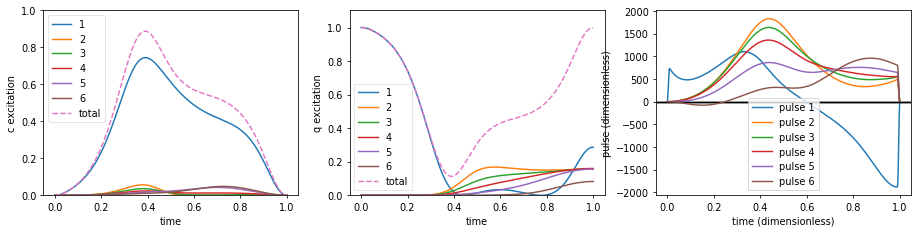

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T1_25


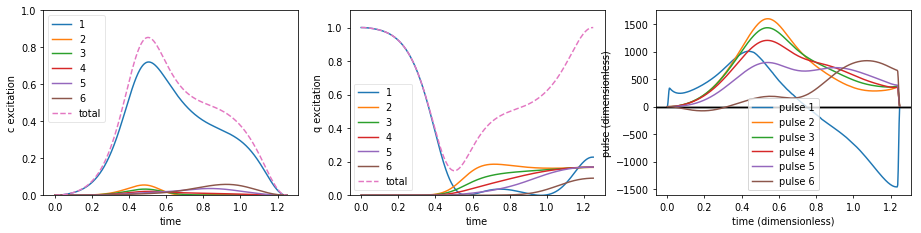

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T1_50


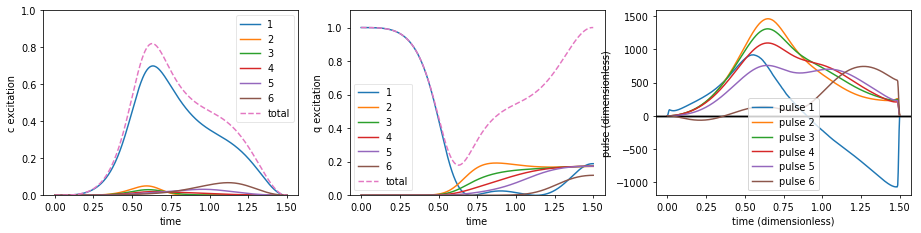

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T1_75


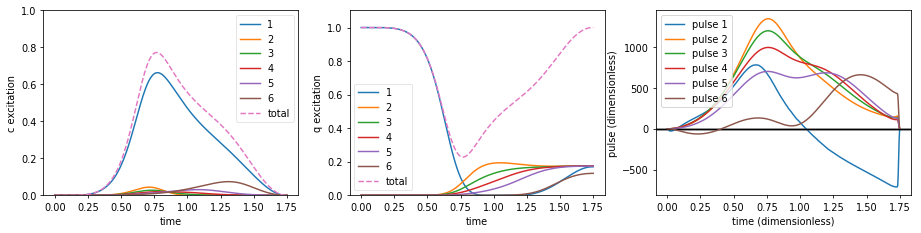

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T2


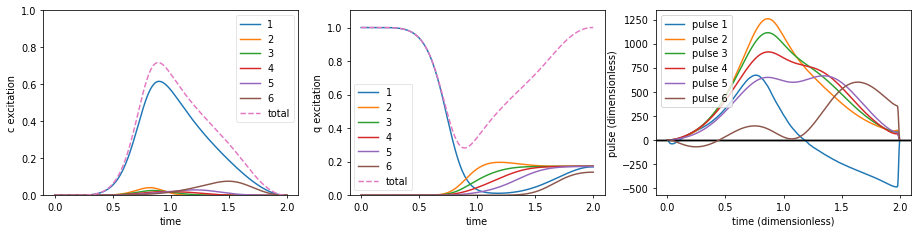

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T2_50


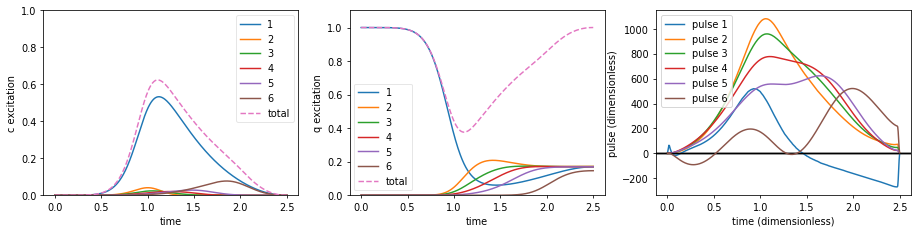

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T3


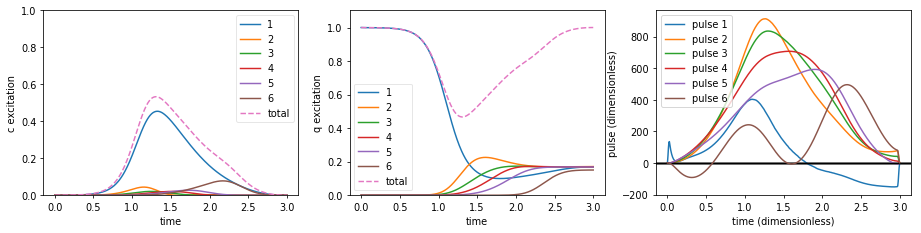

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T3_10


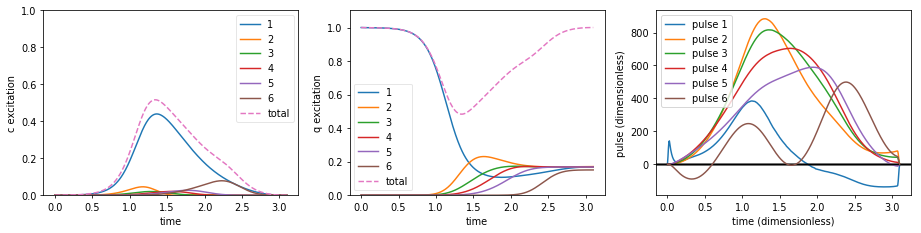

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T3_20


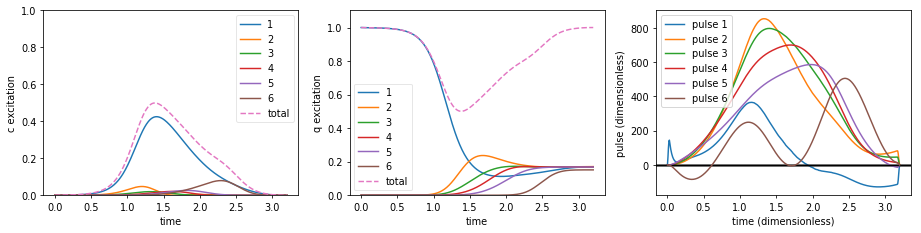

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T3_25


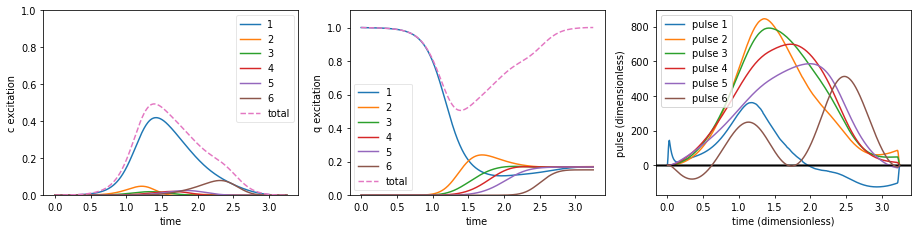

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T3_30


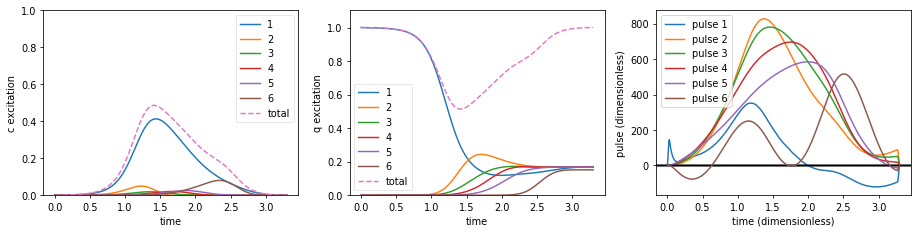

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T3_40


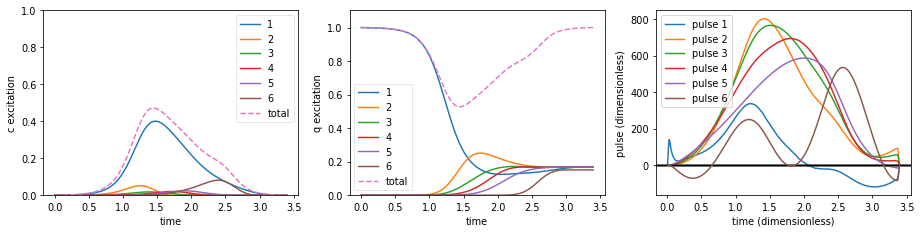

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T3_50


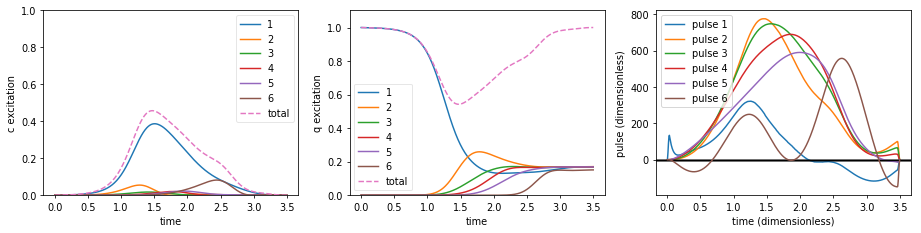

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T4


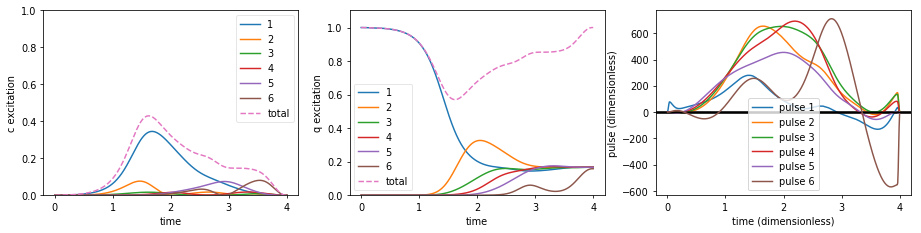

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T4_50


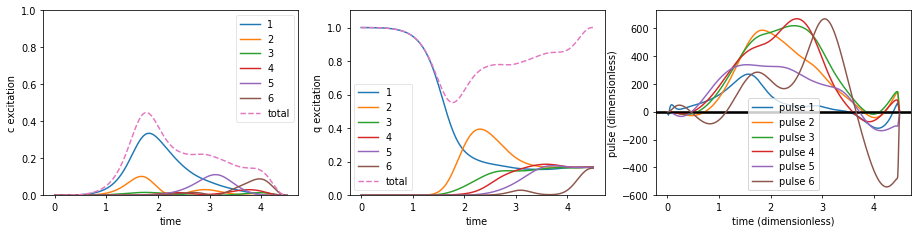

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T5


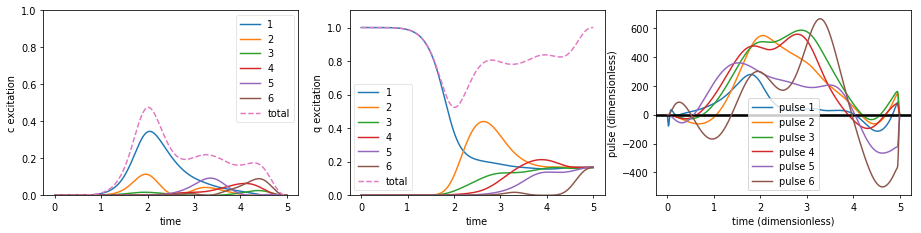

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T5_50


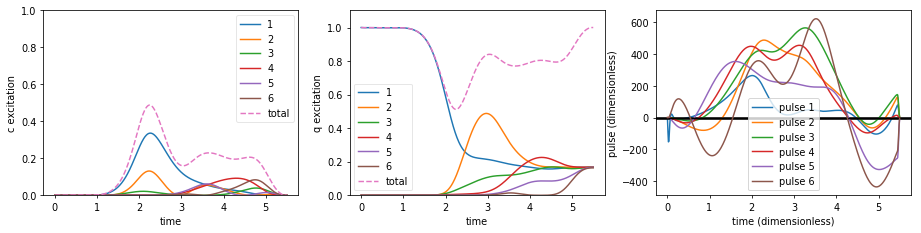

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T6


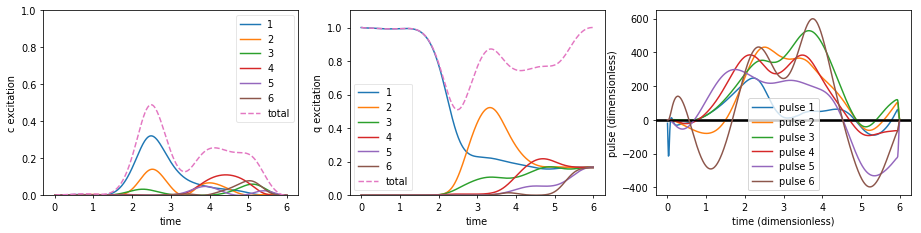

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T7


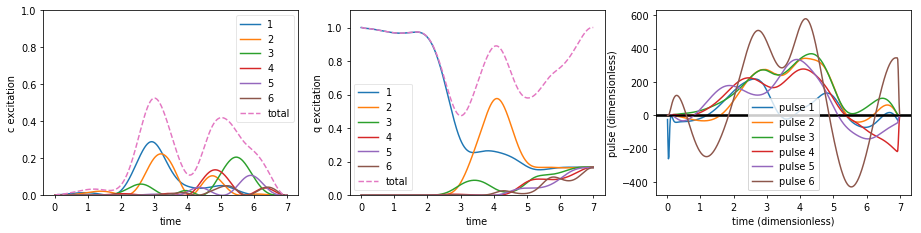

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T8


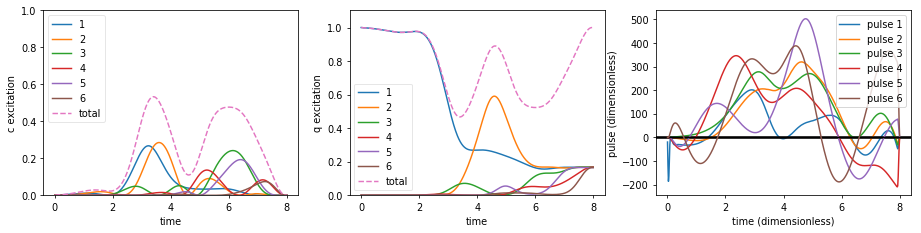

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T9


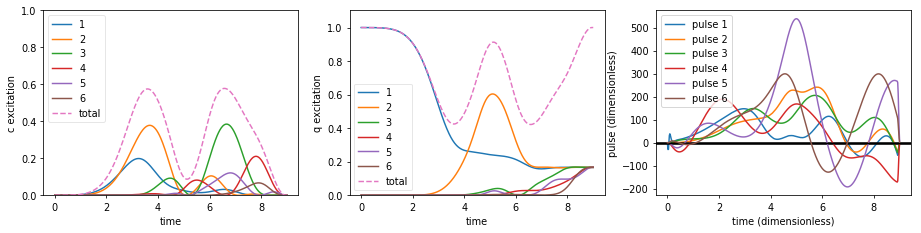

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T10


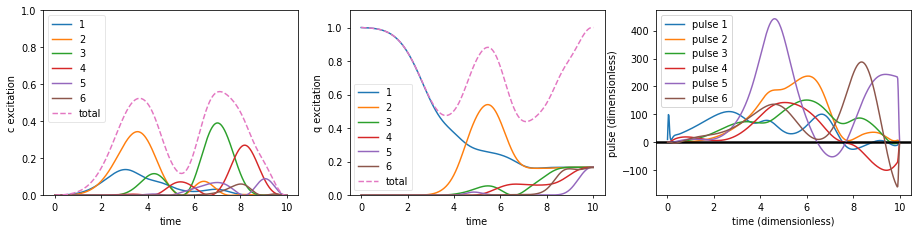

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T12


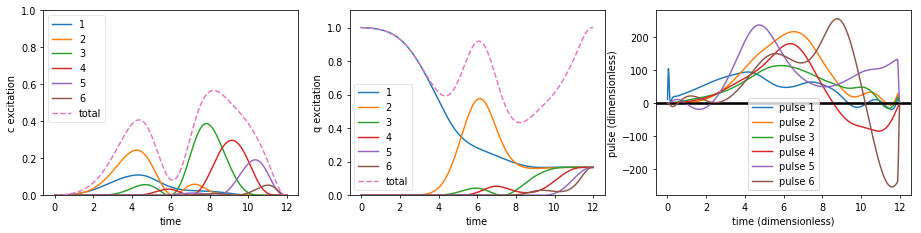

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T14


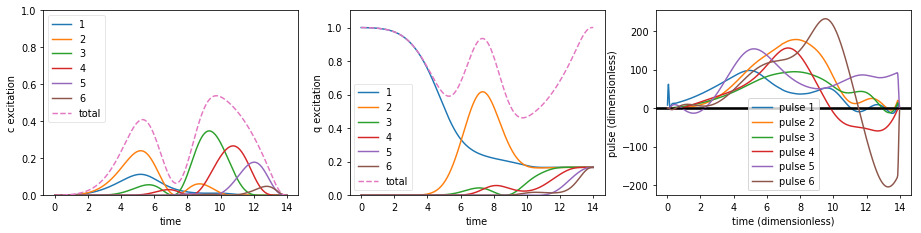

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T15


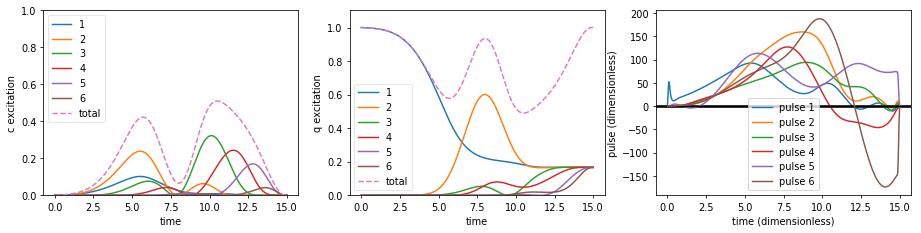

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T18


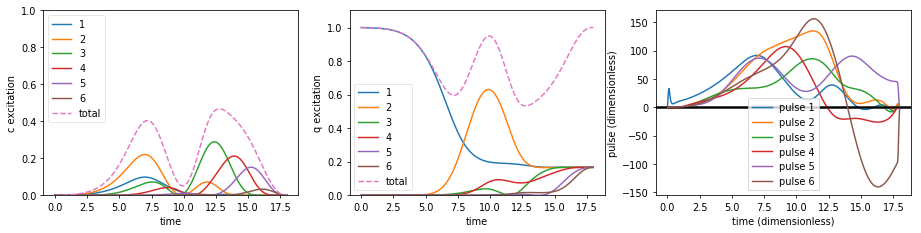

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T20


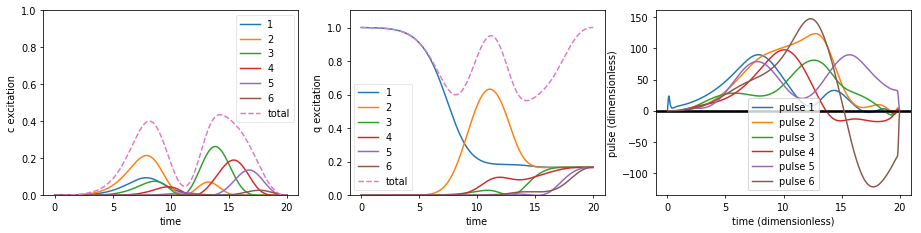

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T50


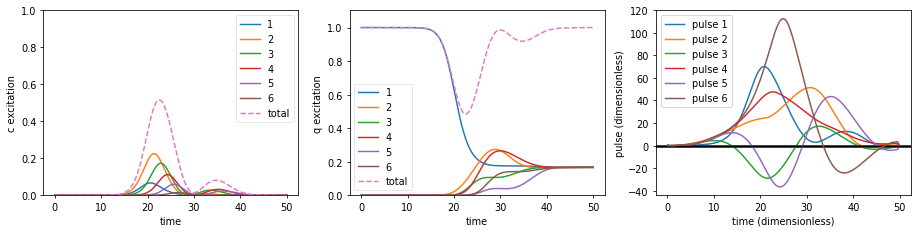

./data/dicke1_QSL_1traj_xxx/rf_6nodes_T70


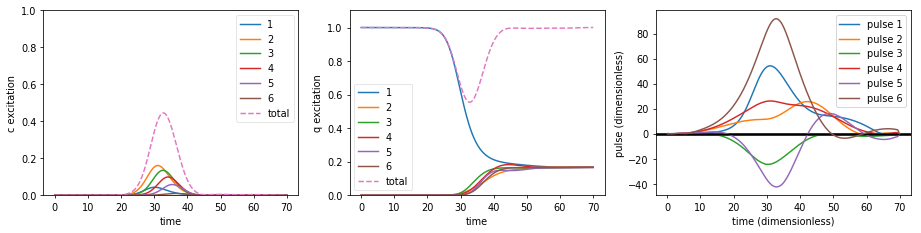

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T1


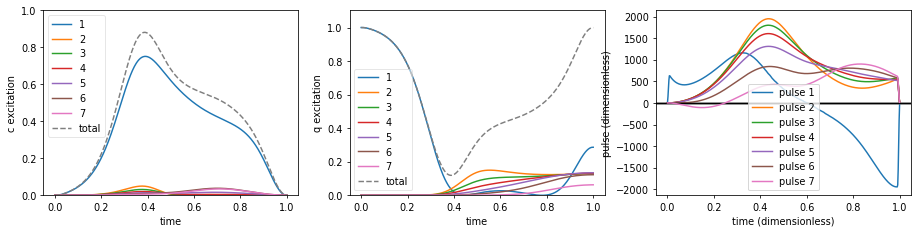

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T1_50


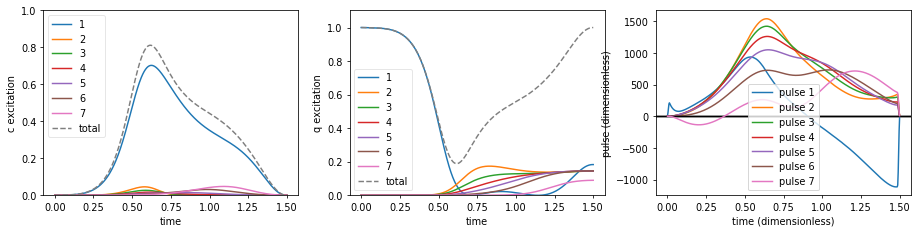

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T1_75


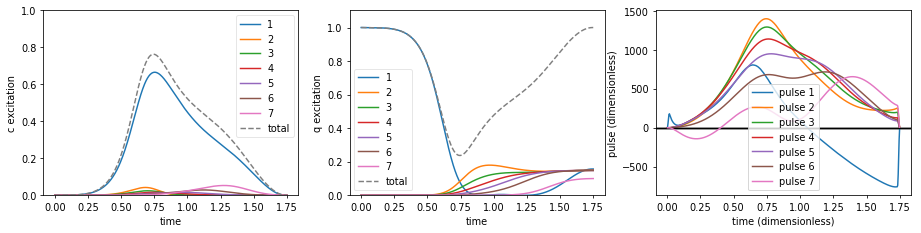

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T2


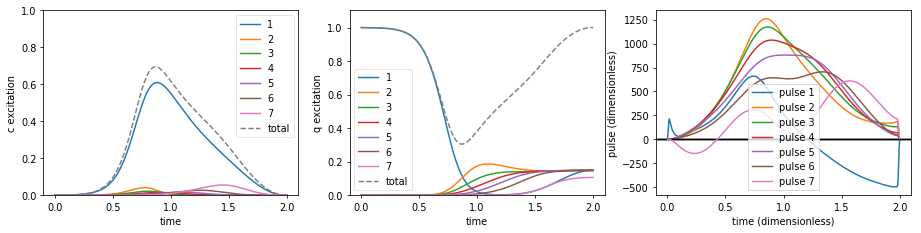

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T2_50


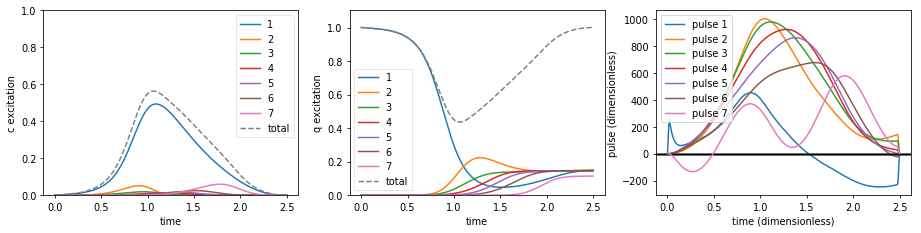

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T3


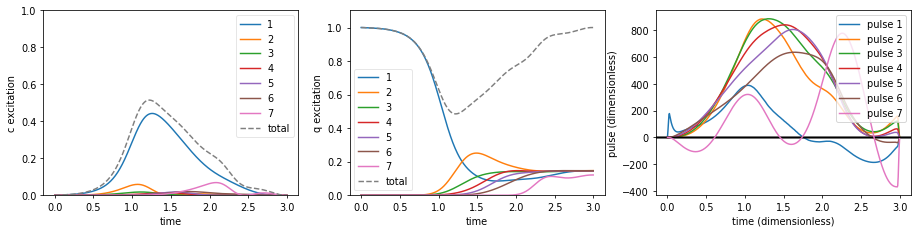

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T3_50


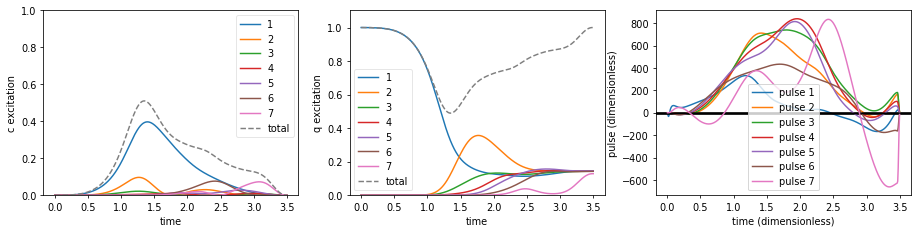

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T4


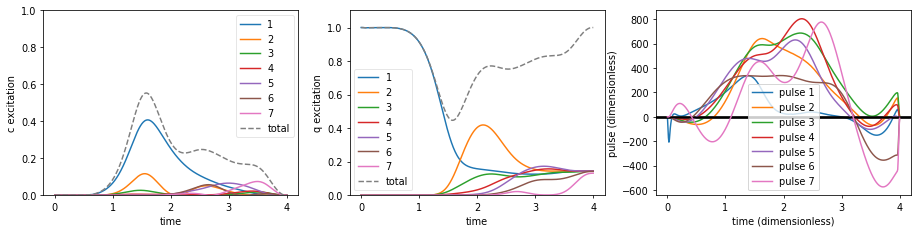

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T4_50


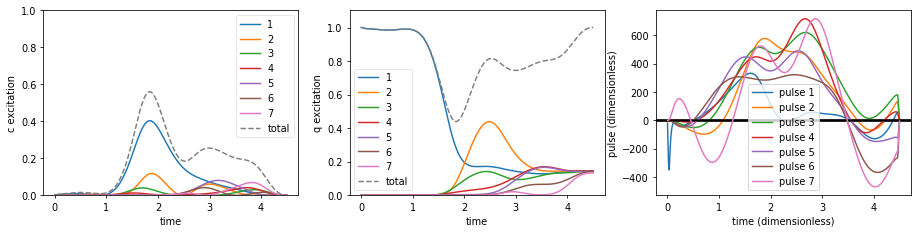

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T5


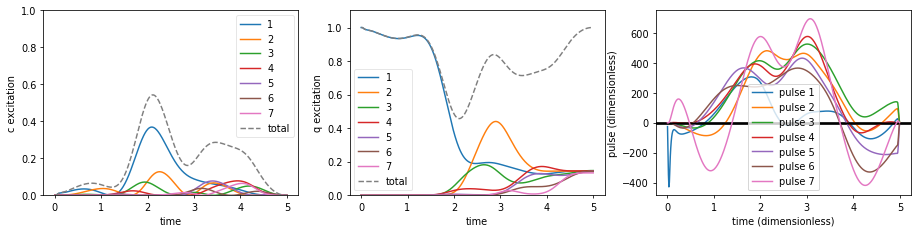

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T5_50


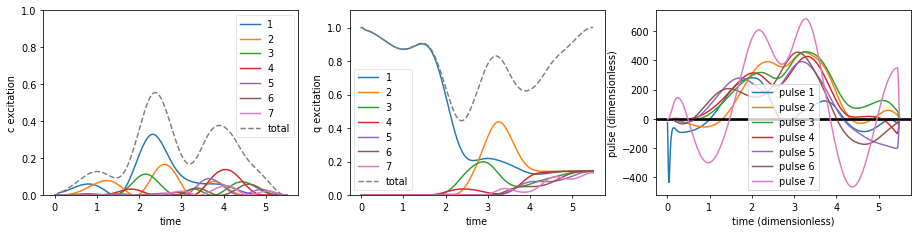

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T6


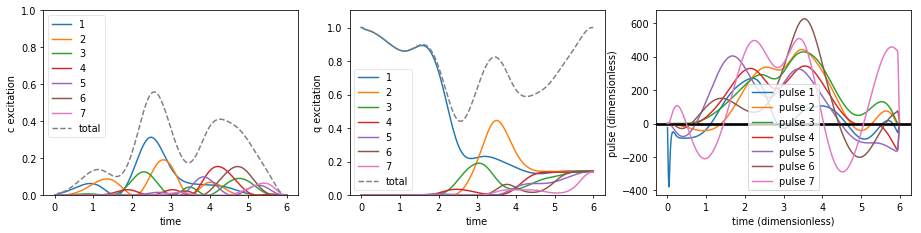

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T8


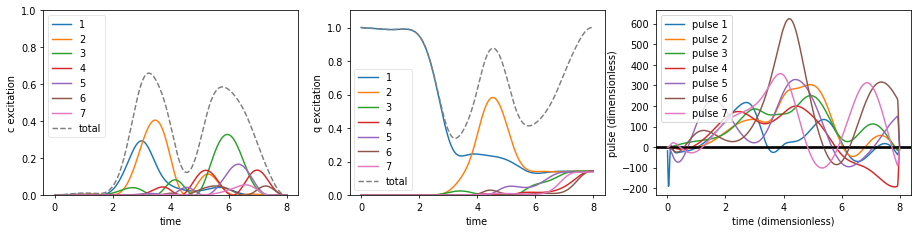

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T9


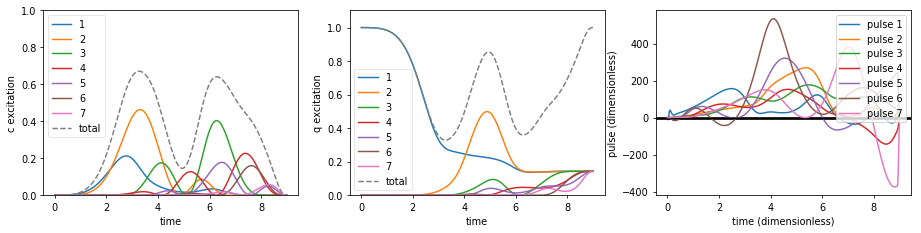

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T10


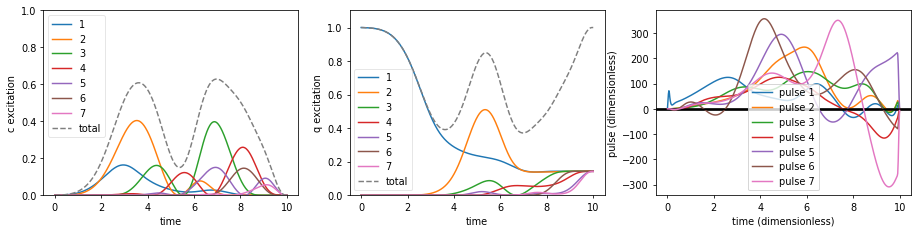

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T12


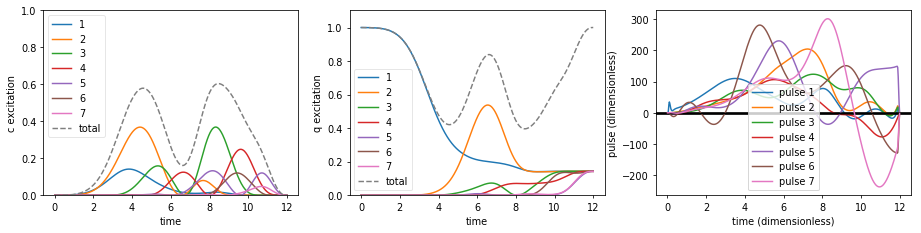

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T14


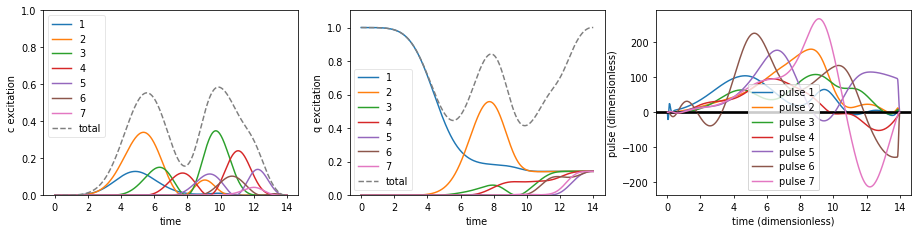

./data/dicke1_QSL_1traj_xxx/rf_7nodes_T15


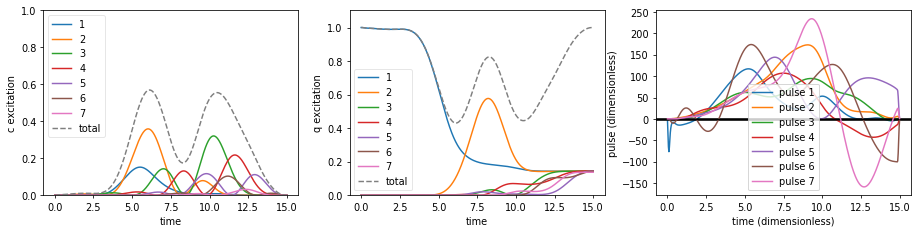

./data/dicke1_QSL_1traj_xxx/rf_8nodes_T10


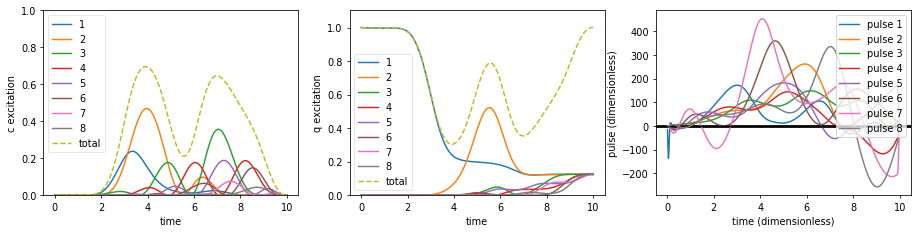

In [26]:
for rf in TABLE['rf']:
    print(rf)
    show_summary_dicke(rf)